# Exotendon Validation printout
########################################################

In [1]:
import datetime; print(datetime.datetime.now())
# jupyter nbconvert --to html exotendon_simulation_r
# esults.ipynb --no-input

print('\n\nNote: all orange/yellow plots are for "Natural" running, while all purple plots are for "Exotendon" running.\n\n')

2026-04-01 11:19:50.322061


Note: all orange/yellow plots are for "Natural" running, while all purple plots are for "Exotendon" running.




In [2]:
# importing packages and setting up utilities
import numpy as np
import matplotlib.pyplot as plt
import os
import pandas as pd
import importlib
# os.add_dll_directory('C:/Users/jonstingel/opensim/opensim-core-4.5-2024-05-15-a1a2282/bin')
os.add_dll_directory('C:/Users/jonstingel/opensim-core-4.5.1-2024-08-23-cf3ef35/bin')
import opensim as osim
import helperOsimFunctions
print('importing packages...')
import nbformat
from IPython.core.interactiveshell import InteractiveShell

# Create an instance of the InteractiveShell
shell = InteractiveShell.instance()
# Example usage: Run the first and second cells in the notebook
notebook_path = './plottingKinematics_meanStandardDev.ipynb'

def run_cell_by_position(notebook_path, position):
    # Read the notebook
    with open(notebook_path, 'r', encoding='utf-8') as f:
        nb = nbformat.read(f, as_version=4)    
    # Get the cell content by position
    cell_content = nb.cells[position].source
    # Execute the cell content
    shell.run_cell(cell_content)

importing packages...


In [3]:
# load some basic data
from turtle import st

print('importing supporting data for 2.7 and 4.0...')
# Load the .csv (s)
# mean_nat = pd.read_csv('mean_coords_nat.csv')
# mean_exo = pd.read_csv('mean_coords_exo.csv')
# std_nat = pd.read_csv('std_coords_nat.csv')
# std_exo = pd.read_csv('std_coords_exo.csv')
mean_nat = pd.read_csv('meansall_coordinates_nat.csv')
mean_exo = pd.read_csv('meansall_coordinates_exo.csv')
std_nat = pd.read_csv('stdsall_coordinates_nat.csv')
std_exo = pd.read_csv('stdsall_coordinates_exo.csv')
# 4 m/s data for coordinates
mean_nat4 = pd.read_csv('Hamner4KinMeans.csv')
std_nat4 = pd.read_csv('Hamner4KinStds.csv')
# and the grf data as well
# meangrfnat = pd.read_csv('mean_externalForces_nat.csv')
# meangrfexo = pd.read_csv('mean_externalForces_exo.csv')
# stdgrfnat = pd.read_csv('std_externalForces_nat.csv')
# stdgrfexo = pd.read_csv('std_externalForces_exo.csv')
meangrfnat = pd.read_csv('meansall_GRF_nat.csv')
meangrfexo = pd.read_csv('meansall_GRF_exo.csv')
stdgrfnat = pd.read_csv('stdsall_GRF_nat.csv')
stdgrfexo = pd.read_csv('stdsall_GRF_exo.csv')
# 4 m/s data for grf
meangrfnat4 = pd.read_csv('Hamner4GRFMeans.csv')
stdgrfnat4 = pd.read_csv('Hamner4GRFStds.csv')
# and the moment data as well - these are for 2.7 m/s 
meanmomnat = pd.read_csv('meansall_moments_nat.csv')
meanmomexo = pd.read_csv('meansall_moments_exo.csv')
stdmomnat = pd.read_csv('stdsall_moments_nat.csv')
stdmomexo = pd.read_csv('stdsall_moments_exo.csv')
# moment data for 4 m/s
meanmomnat4 = pd.read_csv('Hamner4MomMeans.csv')
stdmomnat4 = pd.read_csv('Hamner4MomStds.csv')

# tight solutions that get tracked. 
if 'simTightNat1' not in locals(): 
    print('reloading the tight solutions')
    simTightNat1 = osim.TimeSeriesTable('./goodresults/27ms_mk13_poly5/015_3ActMet_6835_extraTight/3ActMet_kinematicsValues_solution_6835.sto')
    simTightNat2 = osim.TimeSeriesTable('./goodresults/27ms_mk13_poly5/015_3ActMet_6835_9tight/3ActMet_kinematicsValues_solution_6835.sto')

importing supporting data for 2.7 and 4.0...
reloading the tight solutions


>>>>>> CMAanalysis for 2.7 m/s running simulations <<<<<<


>>> printing paper figure for saggital metrics...


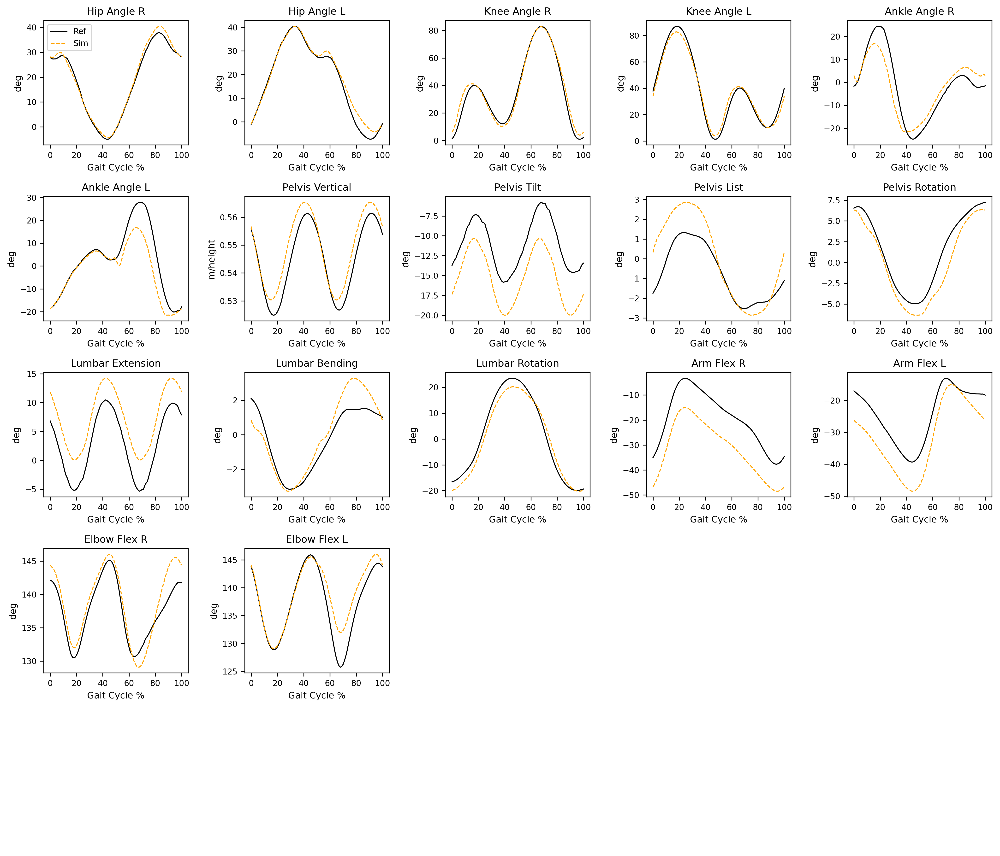

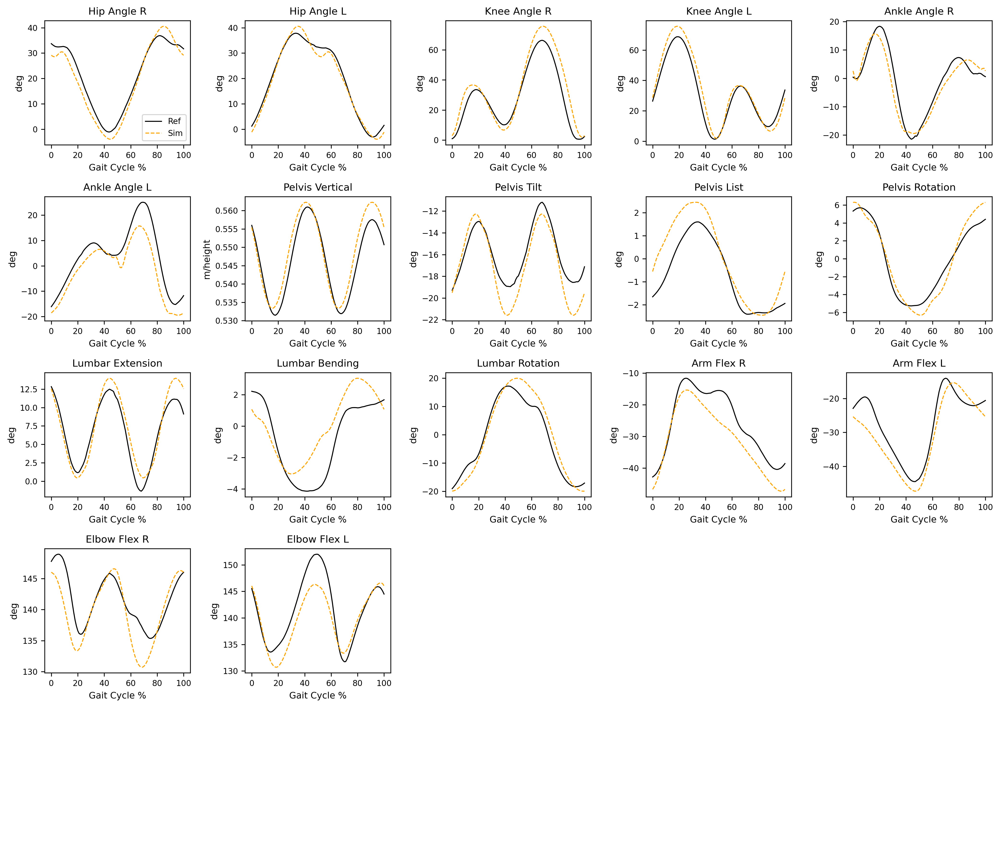

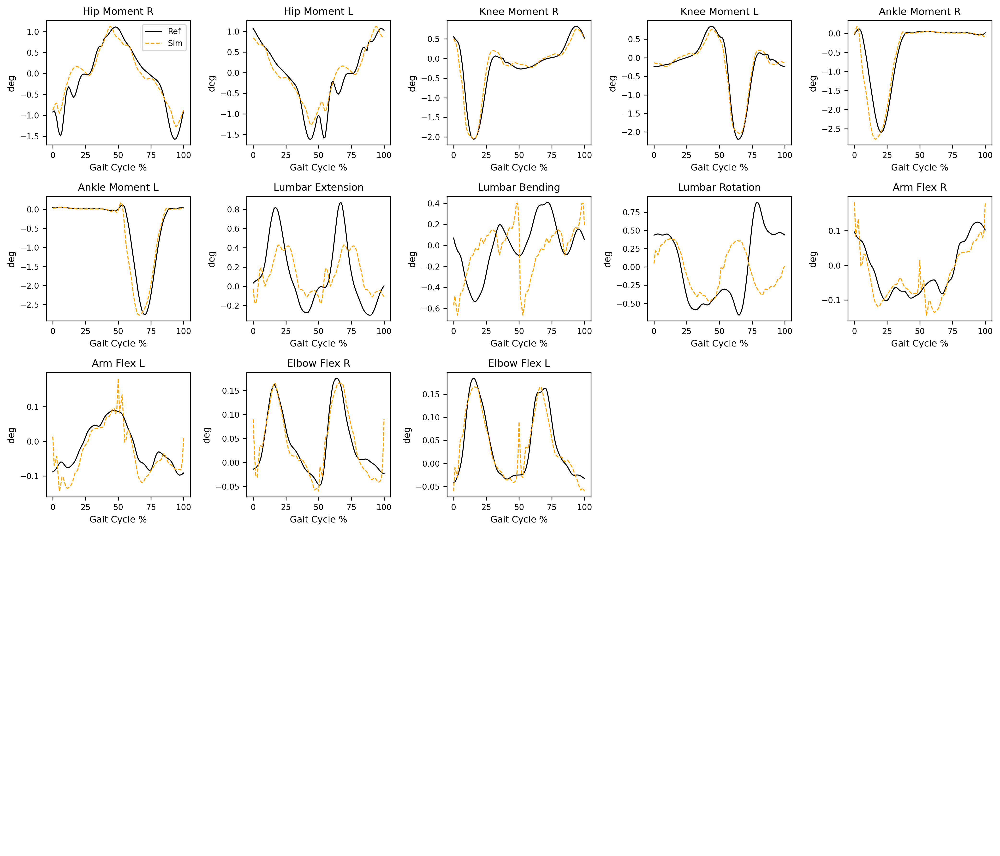

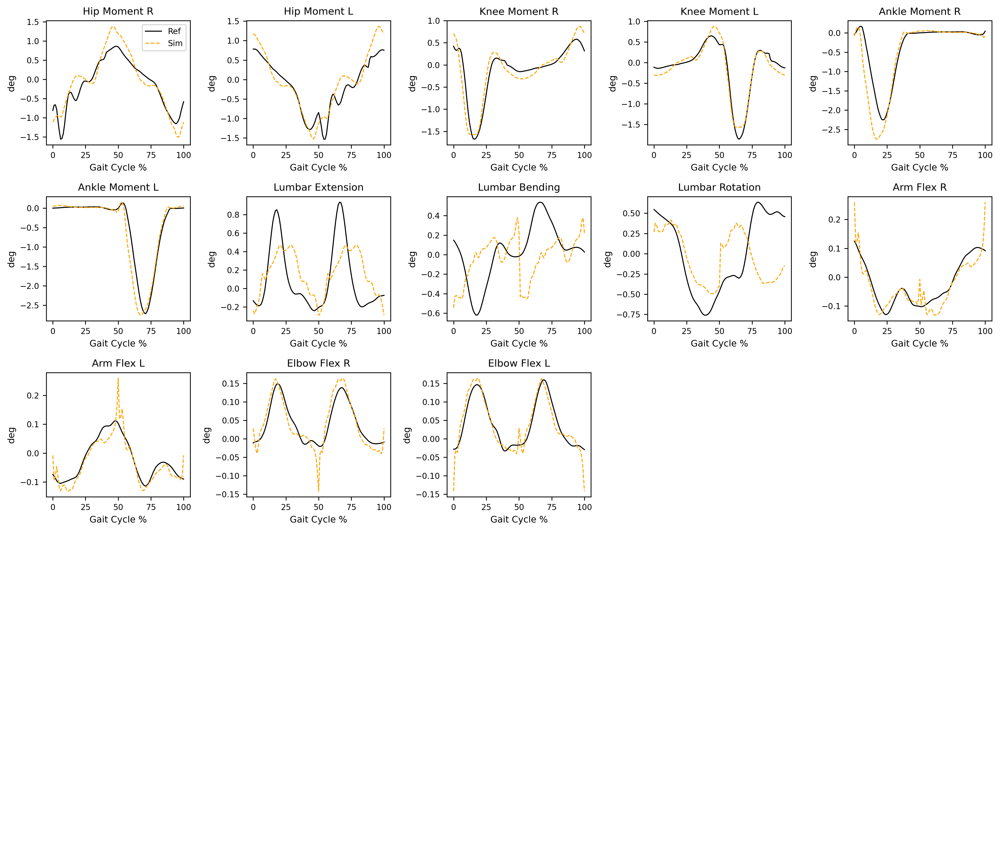


RMSE Values - Natural running 2.7 m/s
Average Kinematic RMSE: 4.03 ± 2.90
Average Muscular Kinematic RMSE: 4.02 ± 1.97
Average GRF RMSE: 0.02 ± 0.01
Average Moment RMSE: 0.21 ± 0.15
Average Muscular Moment RMSE: 0.25 ± 0.07

Hip Angle RMSE: 1.41 deg
Knee Angle RMSE: 3.80 deg
Ankle Angle RMSE: 6.00 deg
Pelvis Vertical RMSE: 0.0053 m/height
Pelvis Tilt RMSE: 4.23 deg
Pelvis List RMSE: 1.17 deg
Pelvis Rotation RMSE: 1.68 deg
Lumbar Extension RMSE: 4.64 deg
Lumbar Bending RMSE: 0.90 deg
Lumbar Rotation RMSE: 2.91 deg
Arm Flexion RMSE: 12.24 deg
Arm Flexion L RMSE: 7.66 deg
Elbow Flexion RMSE: 2.13 deg
Elbow Flexion L RMSE: 2.72 deg

GRF Y RMSE: 0.03 N
GRF X RMSE: 0.02 N

Hip Moment RMSE: 0.26 Nm/kg
Knee Moment RMSE: 0.20 Nm/kg
Ankle Moment RMSE: 0.33 Nm/kg
Lumbar Extension Moment RMSE: 0.27 Nm/kg
Lumbar Bending Moment RMSE: 0.33 Nm/kg
Lumbar Rotation Moment RMSE: 0.55 Nm/kg
Arm Flexion Moment RMSE: 0.04 Nm/kg
Arm Flexion L Moment RMSE: 0.03 Nm/kg
Elbow Flexion Moment RMSE: 0.02 Nm/kg
Elbo

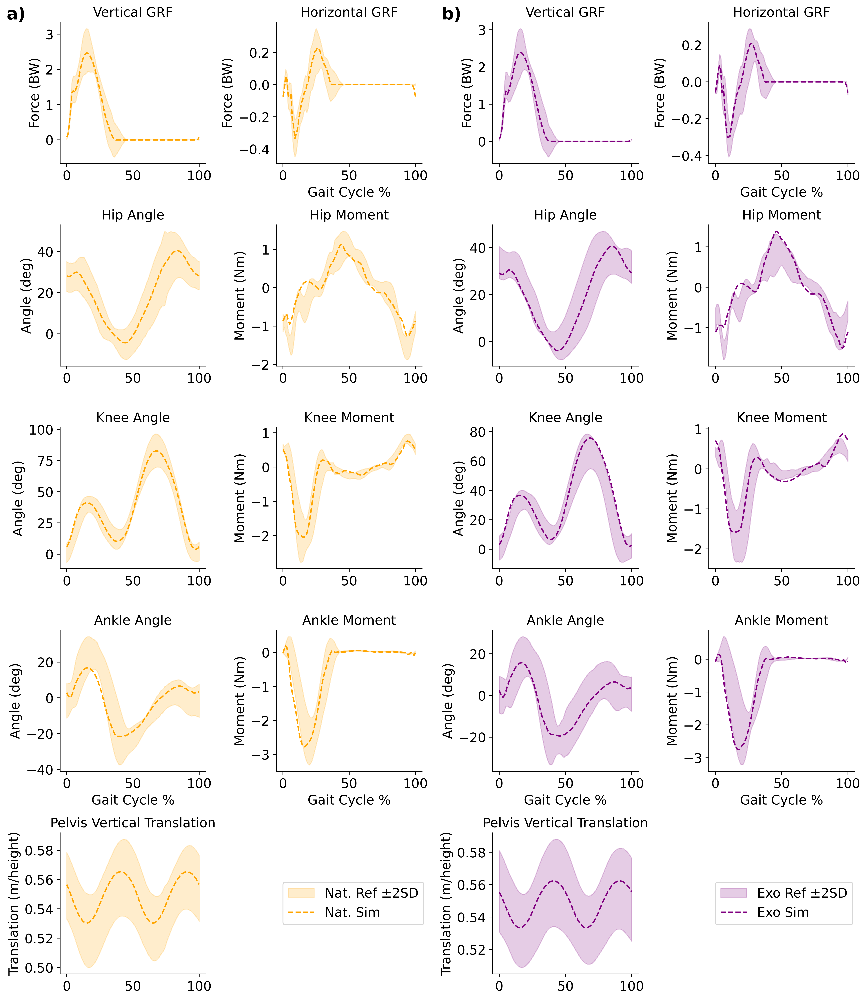

In [4]:
# CMA 2.7 analysis
importlib.reload(helperOsimFunctions)
sim = 'CMA'
print('>>>>>> ' + sim + 'analysis for 2.7 m/s running simulations <<<<<<')

simNatFile = './results/2.7/6835/3CMA_nat_2D3D_OG_muscles_Tracking_solution_FullStride.sto'
natmomentfile = './results/2.7/6835/3CMA_nat_quickAnalysis_joint_moments.sto'
GRFsimnat = './results/2.7/6835/3CMA_nat_2D3D_OG_muscles_Tracking_solutionGRF_FullStride.sto'
natmetfile = './results/2.7/6835/3CMA_nat_quickAnalysis_metabolics_individuals.sto'
natfibers = './results/2.7/6835/3CMA_nat_quickAnalysis_mtu.sto'
natoutputs = './results/2.7/6835/3CMA_nat_quickAnalysis_all.sto'

simExoFile = './results/2.7/648/3CMA_exo_2D3D_OG_muscles_Tracking_solution_FullStride.sto'
GRFsimexo = './results/2.7/648/3CMA_exo_2D3D_OG_muscles_Tracking_solutionGRF_FullStride.sto'
exometfile = './results/2.7/648/3CMA_exo_quickAnalysis_metabolics_individuals.sto'
exomomentfile = './results/2.7/648/3CMA_exo_quickAnalysis_joint_moments.sto'
exofibers = './results/2.7/648/3CMA_nat_quickAnalysis_mtu.sto'
exooutputs = './results/2.7/648/3CMA_nat_quickAnalysis_all.sto'

# modelfile = 'strong_mk14_rv1_dgf_kneedampremoved.osim'
modelfile = 'strong_mk15_rv1_dgf_kneedampremoved.osim'

# load in the IK from the 2D model - use this set of coordinates to evaluate (with the std from 3D curves?)
ikNat2D = osim.TimeSeriesTable('./expData/2D2Darms/27_IK_nat_mk12_rv1_1.mot')
x2d = np.array(ikNat2D.getIndependentColumn())
labels2D = ikNat2D.getColumnLabels()
coordinates2D = np.empty(len(labels2D), dtype=object)
ikexo2D = osim.TimeSeriesTable('./expData/2D2Darms/27_exo_IK_mk12_rv1_1.mot')
coordinates = list(mean_exo.keys())
# GRFreferencenat = './goodresults/27ms_mk13_poly5/015_3ActMet_6835_9tight/3ActMet_2D3D_OG_muscles_Tracking_solutionGRF_FullStride.sto'
# GRFreferenceexo = './goodresults/27ms_mk13_poly5/015_3exoActMet_648_9tight/3exoActMet_2D3D_OG_muscles_Tracking_solutionGRF_FullStride.sto'
GRFreferencenat = './expdata/nat50_1.mot'
GRFreferenceexo = './expdata/exo50_1.mot'
idnat = osim.TimeSeriesTable('./IDtesting/inverse_dynamics15_short_rebase.sto')
idexo = osim.TimeSeriesTable('./IDtesting/inverse_dynamics15_exo_short_rebase.sto')

# load the solutions. 
simNat = osim.TimeSeriesTable(simNatFile)
simExo = osim.TimeSeriesTable(simExoFile)
simLabels = simNat.getColumnLabels()
coordinates_sim, coordinates_sim_clean = helperOsimFunctions.getColumnNames(coordinates, labels2D, simLabels)
# do some plotting and analysis
# print('\n'+"\033[1m"+'>>> Analyzing the 2.7 m/s simulation results in comparison to the same subject"s experimental data...'+"\033[0m")
# helperOsimFunctions.plotCoordinates27(simNat, simExo, ikNat2D, ikexo2D, labels2D, coordinates_sim_clean, std_nat, std_exo)
# print('\n' + "\033[1m" +'>>> Now analyzeing the GRF data for 2.7 m/s simulation with respect to the same subject"s experimental data...' + "\033[0m")
# helperOsimFunctions.grfCompare(GRFsimnat, GRFsimexo, GRFreferencenat, GRFreferenceexo, sim, stdgrfnat, stdgrfexo)
# print('\n' + "\033[1m" + '>>> Now analyzeing the Joint Moment data for 2.7 m/s simulation with respect to the same subject"s experimental data...' + "\033[0m")
# helperOsimFunctions.jointMomentCompare(natmomentfile, exomomentfile, idnat, idexo, sim, stdmomnat, stdmomexo)

# # # # # # # # # # helpful plots for metabolics  
# print('\n' + "\033[1m" + '>>> Now analyzeing the metabolic rate for muscles for 2.7 m/s simulations...' + "\033[0m")
# helperOsimFunctions.muscleMetabolicsCompare(natmetfile, exometfile, modelfile)
# print('\n' + "\033[1m" + '>>> Now analyzeing the stance and swing phase metabolic distributions for muscles for 2.7 m/s simulations...' + "\033[0m")
# helperOsimFunctions.metabolicStanceSwing(natmetfile, exometfile, modelfile, GRFsimnat, GRFsimexo, sim)
# print('\n\n' + "\033[1m" + '>>> Now analyzeing the whole-body metabolics for 2.7 m/s simulations...' + "\033[0m")
# helperOsimFunctions.wholeBodyMetabolics(natmetfile, exometfile, modelfile)

# # # # validation figures
print('\n\n' + "\033[1m" + '>>> printing paper figure for saggital metrics...' + "\033[0m")
helperOsimFunctions.saggitalValidationFigure27(simNat, simExo, ikNat2D, ikexo2D, labels2D, coordinates_sim_clean, mean_nat, std_nat, mean_exo, std_exo, GRFsimnat, GRFsimexo, GRFreferencenat, GRFreferenceexo, meangrfnat, stdgrfnat, meangrfexo, stdgrfexo, natmomentfile, exomomentfile, idnat, idexo, meanmomnat, stdmomnat, meanmomexo, stdmomexo, modelfile)
# print('\n\n' + "\033[1m" + '>>> printing paper figure for saggital metrics...' + "\033[0m")
# helperOsimFunctions.saggitalValidationHalf27(simNat, simExo, ikNat2D, ikexo2D, labels2D, coordinates_sim_clean, mean_nat, std_nat, mean_exo, std_exo, GRFsimnat, GRFsimexo, GRFreferencenat, GRFreferenceexo, meangrfnat, stdgrfnat, meangrfexo, stdgrfexo, natmomentfile, exomomentfile, idnat, idexo, meanmomnat, stdmomnat, meanmomexo, stdmomexo, modelfile)
# print('\n\n' + "\033[1m" + '>>> printing paper figure for saggital metrics...' + "\033[0m")
# helperOsimFunctions.saggitalValidationSplit27(simNat, simExo, ikNat2D, ikexo2D, labels2D, coordinates_sim_clean, mean_nat, std_nat, mean_exo, std_exo, GRFsimnat, GRFsimexo, GRFreferencenat, GRFreferenceexo, meangrfnat, stdgrfnat, meangrfexo, stdgrfexo, natmomentfile, exomomentfile, idnat, idexo, meanmomnat, stdmomnat, meanmomexo, stdmomexo, modelfile)
# print('\n\n' + "\033[1m" + '>>> printing paper figure for metabolic validation...' + "\033[0m")
# metval27 = helperOsimFunctions.metabolicValidationFigure27(natmetfile, exometfile, modelfile, GRFsimnat, GRFsimexo)
# print('\n\n' + "\033[1m" + '>>> printing paper figure for individual muscle metabolic validation...' + "\033[0m")
# musclemet27 = helperOsimFunctions.muscleSaversValidationFigure27(natmetfile, exometfile, modelfile, GRFsimnat, GRFsimexo)
# print('\n\n' + "\033[1m" + '>>> printing paper figure for individual muscle metabolic validation stance and swing...' + "\033[0m")
# stancemet27, swingmet27 = helperOsimFunctions.muscleSaversStanceSwingValidationFigure27(natmetfile, exometfile, modelfile, GRFsimnat, GRFsimexo)

# results figures
# print('\n\n' + "\033[1m" + '>>> printing paper figure for grid search results at 2.7 m/s...' + "\033[0m")
# helperOsimFunctions.resultsGridSearch27('exotendonParameterOptimization.xlsx')

# muscle activation processing
# print('\n\n' + "\033[1m" + '>>> printing paper figure for muscle activations at 2.7 m/s...' + "\033[0m")
# helperOsimFunctions.muscleActivityPlotting(natoutputs, exooutputs)

# working on debuggin the 4 m/s knee flexion issues. 
# start with fiber length, mtu length, tendon slack length
# fiberhtml = helperOsimFunctions.fiberPlotting(modelfile, natfibers, exofibers)
# forcecaphtml, multihtml = helperOsimFunctions.forceCapacityPlotting(modelfile, natoutputs, exooutputs)
# helperOsimFunctions.fiberPropertiesPlotting(modelfile, natfibers, exofibers, natoutputs, exooutputs, True)
# helperOsimFunctions.fiberPropertiesPlotting(modelfile, exofibers, natfibers, exooutputs, natoutputs, True)


# # and the GRF comparison cell
# run_cell_by_position(notebook_path, 10)
# # and the metabolic rate for muscles
# run_cell_by_position(notebook_path, 11)
# run_cell_by_position(notebook_path, 12)
# ## test running the grf plot cells below as well
# # run_cell_by_position(notebook_path, 6)  # Run the second cell   # 0.7235
# # run_cell_by_position(notebook_path, 4)  # Run the first cell       # 0.6835
# # run_cell_by_position(notebook_path, 5)  # Run the second cell     # 0.648
# # run_cell_by_position(notebook_path, 7)  # Run the second cell   # 0.608

>>>>>> CMA_4analysis for 4 m/s running simulations <<<<<<


>>> printing paper figure for saggital metrics...


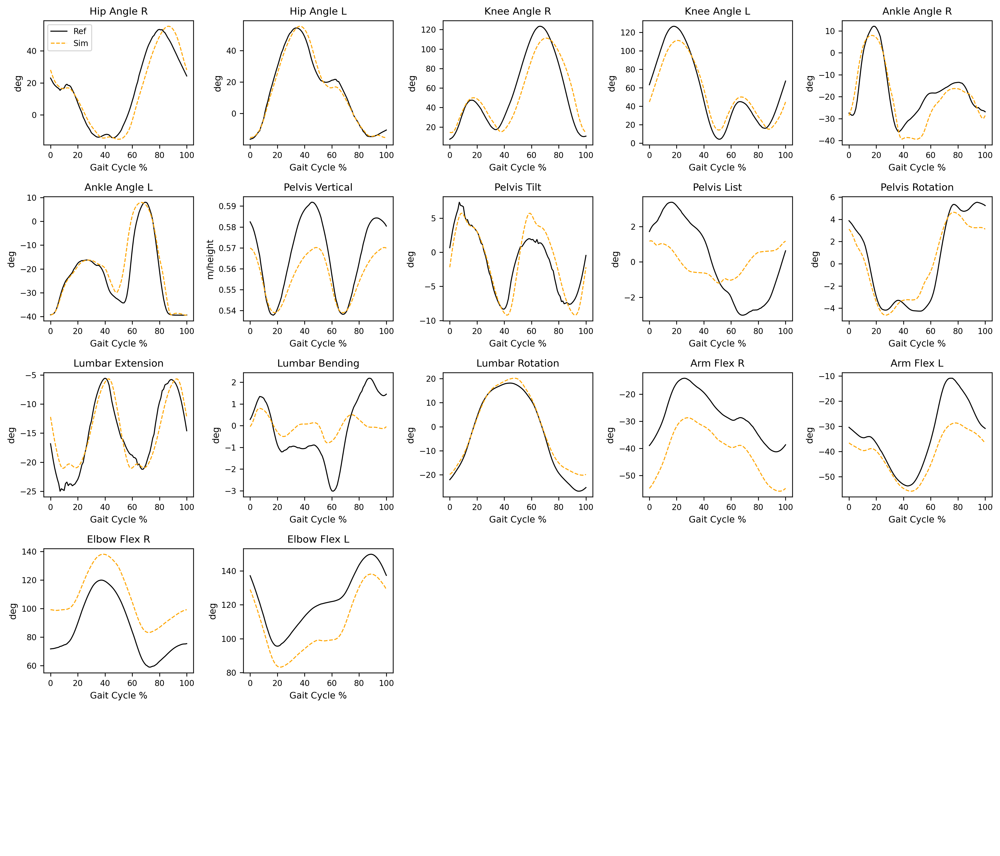

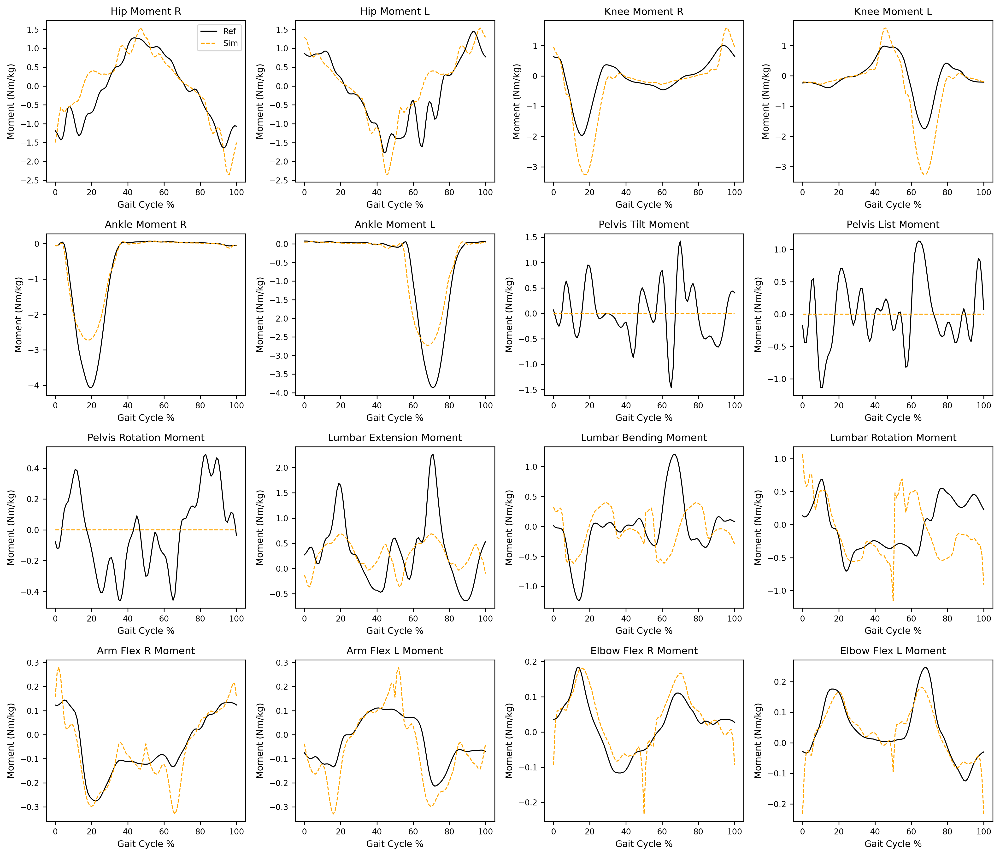


RMSE Values - Natural Walking
Hip Angle RMSE:        7.1503 degrees
Knee Angle RMSE:       15.5591 degrees
Ankle Angle RMSE:      6.3293 degrees
Pelvis Vertical RMSE:  0.0127 (normalized)
Hip Angle Left RMSE:   3.3532 degrees
Knee Angle Left RMSE:  12.3513 degrees
Ankle Angle Left RMSE: 5.8835 degrees
Pelvis Tilt RMSE:     2.1173 degrees
Pelvis List RMSE:     2.1751 degrees
Pelvis Rotation RMSE: 1.3776 degrees
Lumbar Extension RMSE: 2.4879 degrees
Lumbar Bending RMSE:  1.2634 degrees
Lumbar Rotation RMSE: 3.0282 degrees
Arm Flexion R RMSE:   13.3724 degrees
Arm Flexion L RMSE:   9.1884 degrees
Elbow Flexion R RMSE: 21.7484 degrees
Elbow Flexion L RMSE: 15.7921 degrees
Average RMSE across all kinematics: 7.2465 degrees
Standard Deviation of RMSE across all kinematics: 6.1962 degrees
Average RMSE across lower limb kinematics: 8.4378 degrees
Standard Deviation of RMSE across lower limb kinematics: 4.1735 degrees


GRF Vertical RMSE:     0.1358 (BW)
GRF Horizontal RMSE:   0.0407 (BW)
Aver

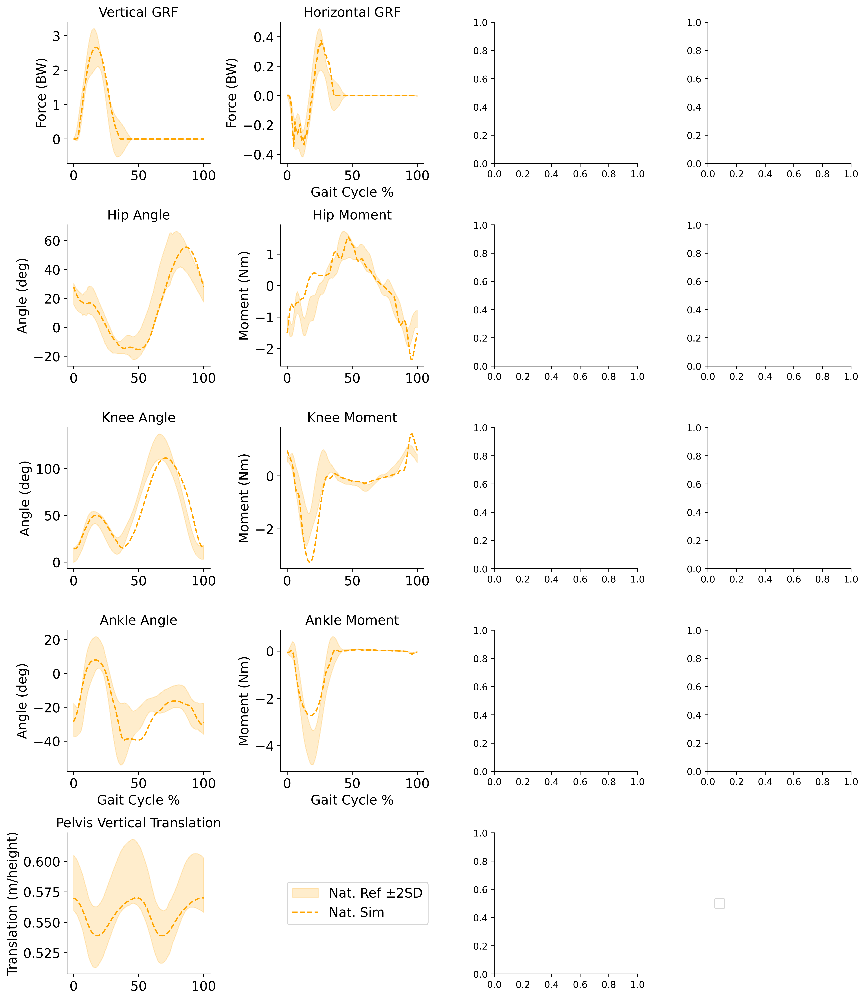

In [9]:
# CMA 4.0 m/s analysis
importlib.reload(helperOsimFunctions)
sim = 'CMA_4'
print('>>>>>> ' + sim + 'analysis for 4 m/s running simulations <<<<<<')
simNatFile = './results/4.0/644/4CMA_nat_2D3D_OG_muscles_Tracking_solution_FullStride.sto'
GRFsimnat = './results/4.0/644/4CMA_nat_2D3D_OG_muscles_Tracking_solutionGRF_FullStride.sto'
natmetfile40 = './results/4.0/644/4CMA_nat_quickAnalysis_metabolics_individuals.sto'
natmomentfile = './results/4.0/644/4CMA_nat_quickAnalysis_joint_moments.sto'
natfibers = './results/4.0/644/4CMA_nat_quickAnalysis_mtu.sto'
natoutputs = './results/4.0/644/4CMA_nat_quickAnalysis_all.sto'

simExoFile = './results/4.0/604/4CMA_exo_long_stiff2_2D3D_OG_muscles_Tracking_solution_FullStride.sto'
GRFsimexo = './results/4.0/604/4CMA_exo_long_stiff2_2D3D_OG_muscles_Tracking_solutionGRF_FullStride.sto'
exometfile40 = './results/4.0/604/4CMA_exo_long_stiff2_quickAnalysis_metabolics_individuals.sto'
exomomentfile = './results/4.0/604/4CMA_exo_long_stiff2_quickAnalysis_joint_moments.sto'
exofibers = './results/4.0/604/4CMA_exo_long_stiff2_quickAnalysis_mtu.sto'
exooutputs = './results/4.0/604/4CMA_exo_long_stiff2_quickAnalysis_all.sto'

# modelfile = 'strong_mk14_rv1_dgf_kneedampremoved.osim'
modelfile = 'strong_mk15_rv1_dgf_kneedampremoved.osim'

# and the reference data. 
# load in the IK from the 2D model - use this set of coordinates to evaluate (with the std from 3D curves?)
ikNat2D = osim.TimeSeriesTable('./expData/Ham19_4ms/4_IK_mk13_rv1_nat_trim.mot')
x2d = np.array(ikNat2D.getIndependentColumn())
labels2D = ikNat2D.getColumnLabels()
coordinates2D = np.empty(len(labels2D), dtype=object)
# ikexo2D = osim.TimeSeriesTable('./expData/2D2Darms/27_exo_IK_mk12_rv1_1.mot')
coordinates = list(mean_exo.keys())
# GRFreferencenat = './goodresults/4ms_mk13_poly5/015_4ActMet_684_tight/4ActMet_2D3D_OG_muscles_Tracking_solutionGRF_FullStride.sto'
# GRFreferenceexo = './goodresults/27ms_mk13_poly5/015_3exoActMet_648_9tight/4exoActMet_2D3D_OG_muscles_Tracking_solutionGRF_FullStride.sto' # not really needed and wrong data. 
GRFreferencenat = './expData/Ham19_4ms/GRF_mk13_rv1_4ms_1.mot'
idnat = osim.TimeSeriesTable('./expData/Ham19_4ms/inverse_dynamics_Hamner_4_19.sto')
# idexo = doesn't exist 

# load the solutions. 
simNat = osim.TimeSeriesTable(simNatFile)
simExo = osim.TimeSeriesTable(simExoFile)
simLabels = simNat.getColumnLabels()
coordinates_sim, coordinates_sim_clean = helperOsimFunctions.getColumnNames(coordinates, labels2D, simLabels)

# # # do some plotting and analysis
# print('\n'+"\033[1m"+'>>> Analyzing the 4.0 m/s simulation results in comparison to the same subject"s experimental data...'+"\033[0m")
# helperOsimFunctions.plotCoordinates40(simNat, simExo, ikNat2D, labels2D, coordinates_sim_clean, std_nat4)
# print('\n' + "\033[1m" +'>>> Now analyzeing the GRF data for 4.0 m/s simulation with respect to the same subject"s experimental data...' + "\033[0m")
# helperOsimFunctions.grfCompare(GRFsimnat, GRFsimexo, GRFreferencenat, None, sim, stdgrfnat, None)
# print('\n' + "\033[1m" + '>>> Now analyzeing the Joint Moment data for 4.0 m/s simulation with respect to the same subject"s experimental data...' + "\033[0m")
# helperOsimFunctions.jointMomentCompare(natmomentfile, exomomentfile, idnat, None, sim, stdmomnat, None)

# # # # helpful plots for metabolics
# print('\n' + "\033[1m" + '>>> Now analyzeing the metabolic rate for muscles for 4.0 m/s simulations...' + "\033[0m")
# helperOsimFunctions.muscleMetabolicsCompare(natmetfile, exometfile, modelfile)
# print('\n' + "\033[1m" + '>>> Now analyzeing the stance and swing phase metabolic distributions for muscles for 4.0 m/s simulations...' + "\033[0m")
# helperOsimFunctions.metabolicStanceSwing(natmetfile40, exometfile40, modelfile, GRFsimnat, GRFsimexo, sim)
# print('\n\n' + "\033[1m" + '>>> Now analyzeing the whole-body metabolics for 4.0 m/s simulations...' + "\033[0m")
# helperOsimFunctions.wholeBodyMetabolics(natmetfile40, exometfile40, modelfile)

# # # # validation figures
print('\n\n' + "\033[1m" + '>>> printing paper figure for saggital metrics...' + "\033[0m")
helperOsimFunctions.saggitalValidationFigure40(simNat, ikNat2D, labels2D, coordinates_sim_clean, mean_nat, std_nat, GRFsimnat, GRFreferencenat, meangrfnat, stdgrfnat, natmomentfile, idnat, meanmomnat, stdmomnat, modelfile)
# print('\n\n' + "\033[1m" + '>>> printing paper figure for saggital metrics...' + "\033[0m")
# helperOsimFunctions.saggitalValidationSplit40(simNat, simExo, ikNat2D, labels2D, coordinates_sim_clean, mean_nat4, std_nat4, GRFsimnat, GRFsimexo, GRFreferencenat, meangrfnat4, stdgrfnat4, natmomentfile, exomomentfile, idnat, meanmomnat4, stdmomnat4, modelfile)
# # print('\n\n' + "\033[1m" + '>>> printing paper figure for metabolic validation...' + "\033[0m")
# helperOsimFunctions.metabolicValidationFigure40(metval27, modelfile, GRFsimnat, GRFsimexo, natmetfile40, exometfile40)
# print('\n\n' + "\033[1m" + '>>> printing paper figure for individual muscle metabolic validation...' + "\033[0m")
# helperOsimFunctions.muscleSaversValidationFigure40(natmetfile40, exometfile40, modelfile, GRFsimnat, GRFsimexo, musclemet27)
# print('\n\n' + "\033[1m" + '>>> printing paper figure for individual muscle metabolic validation stance and swing...' + "\033[0m")
# helperOsimFunctions.muscleSaversStanceSwingValidationFigure40(natmetfile40, exometfile40, modelfile, GRFsimnat, GRFsimexo, swingmet27, stancemet27)

# working on debuggin the 4 m/s knee flexion issues. 
# start with fiber length, mtu length, tendon slack length
# fiberhtml = helperOsimFunctions.fiberPlotting(modelfile, natfibers, exofibers)
# forcecaphtml, multihtml = helperOsimFunctions.forceCapacityPlotting(modelfile, natoutputs, exooutputs)

# muscle activation processing
# print('\n\n' + "\033[1m" + '>>> printing paper figure for muscle activations at 4.0 m/s...' + "\033[0m")
# helperOsimFunctions.muscleActivityPlotting(natoutputs, exooutputs)

## these ones for fiber stuff
# helperOsimFunctions.fiberPropertiesPlotting(modelfile, natfibers, exofibers, natoutputs, exooutputs, True)
# helperOsimFunctions.fiberPropertiesPlotting(modelfile, exofibers, natfibers, exooutputs, natoutputs, True)

# # and the GRF comparison cell
# run_cell_by_position(notebook_path, 10)
# # and the metabolic rate for muscles
# run_cell_by_position(notebook_path, 11)
# run_cell_by_position(notebook_path, 12)
# ## test running the grf plot cells below as well
# # run_cell_by_position(notebook_path, 6)  # Run the second cell   # 0.7235
# # run_cell_by_position(notebook_path, 4)  # Run the first cell       # 0.6835
# # run_cell_by_position(notebook_path, 5)  # Run the second cell     # 0.648
# # run_cell_by_position(notebook_path, 7)  # Run the second cell   # 0.608

In [ ]:
## 4.0 m/s results for the set stride durations. - don't do this one... 

# importlib.reload(helperOsimFunctions)
# # lets take a look at the differences in the exotendon applied force.
# resultsdir = 'C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning_2d\\results\\4.0\\604\\'
# modelfile = 'strong_mk15_rv1_dgf_kneedampremoved.osim'
# helperOsimFunctions.exotendonTensionPlotting(modelfile, resultsdir)

['C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning_2d\\results\\4.0\\604\\4CMA_exo_short2_stiff2_quickAnalysis_HOBL.sto', 'C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning_2d\\results\\4.0\\644\\4CMA_exo_long2_compliant2_quickAnalysis_HOBL.sto', 'C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning_2d\\results\\4.0\\644\\4CMA_exo_long_compliant2_quickAnalysis_HOBL.sto', 'C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning_2d\\results\\4.0\\644\\4CMA_exo_long2_compliant_quickAnalysis_HOBL.sto', 'C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning_2d\\results\\4.0\\644\\4CMA_exo_compliant2_quickAnalysis_HOBL.sto', 'C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning_2d\\results\\4.0\\644\\4CMA_exo_short_compliant2_quickAnalysis_HOBL.sto', 'C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning_2d\\results\\4.0\\64

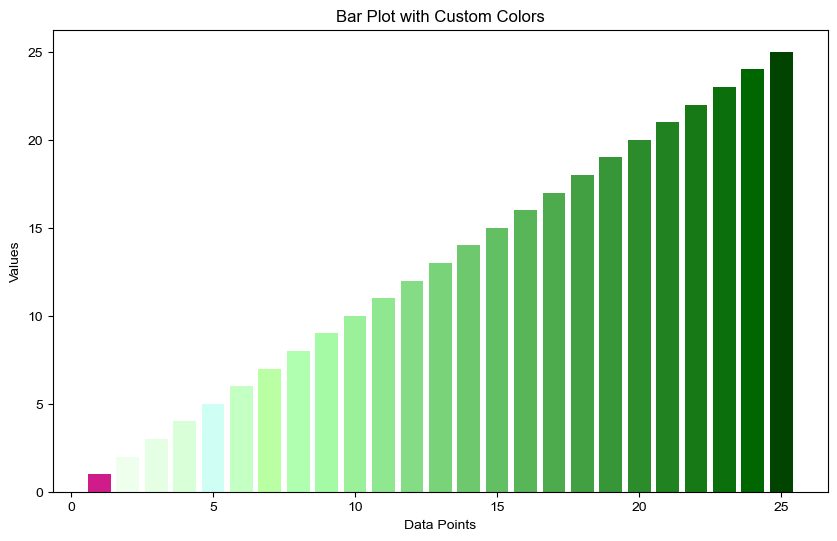

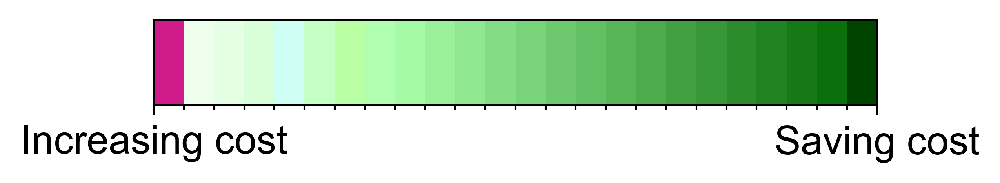

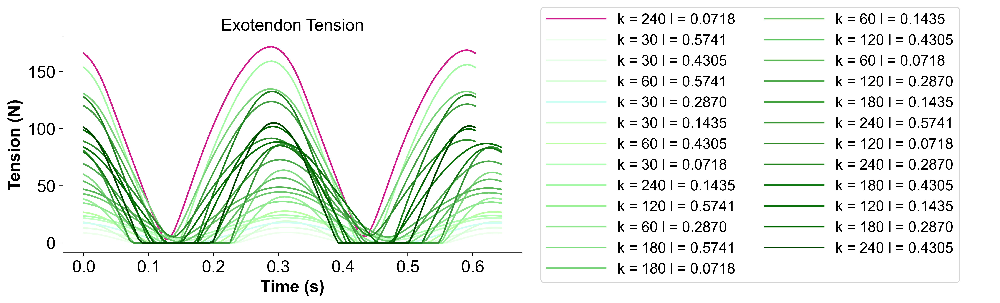

['C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning', '2d\\results\\4.0\\604\\4CMA', 'exo', 'short2', 'stiff2', 'quickAnalysis', 'HOBL.sto']
['C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning', '2d\\results\\4.0\\644\\4CMA', 'exo', 'long2', 'compliant2', 'quickAnalysis', 'HOBL.sto']
['C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning', '2d\\results\\4.0\\644\\4CMA', 'exo', 'long', 'compliant2', 'quickAnalysis', 'HOBL.sto']
k=30 | l=0.43
13.573112893956338
['C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning', '2d\\results\\4.0\\644\\4CMA', 'exo', 'long2', 'compliant', 'quickAnalysis', 'HOBL.sto']
['C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning', '2d\\results\\4.0\\644\\4CMA', 'exo', 'compliant2', 'quickAnalysis', 'HOBL.sto']
['C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning', '2d\\results\\4.0\\644\\4CMA', 'exo', 'short'

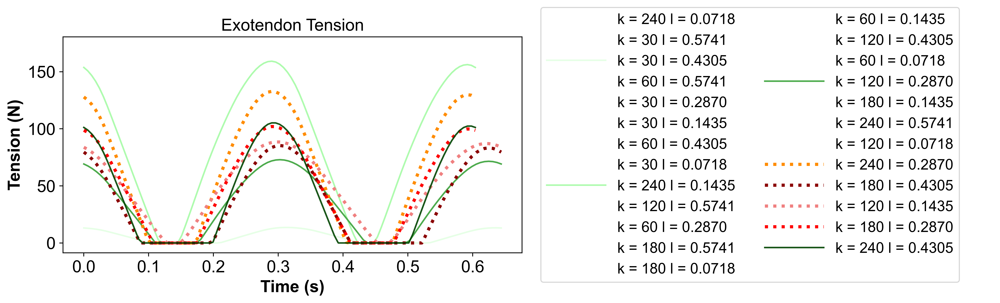

Selected tension values
[ 13.57311289 159.19759303 105.17670706]
Max tension values
[171.91951643   9.21031474  13.57311289  19.08639561  17.92656544
  22.25606937  27.92378322  24.32035366 159.19759303  40.55494997
  36.35225094  63.79332575 134.87615152  44.68018377  57.11306382
  48.82744208  72.92370312 123.89279779  86.62945342  91.7277203
 132.7454494   85.30856858  88.48178496 101.99195674 105.17670706]
Average tension
71.2195685442224
Standard deviation
46.71780665740615
##################
Top 5 tension values
[105.17670706 132.7454494   85.30856858  88.48178496 101.99195674]
Average tension
102.74089334749677
Standard deviation
16.816513296678163


In [5]:
importlib.reload(helperOsimFunctions)
## 4.0 m/s results for the metabolic minimum stride length.

# do the editing to get the right metabolic minimum stride length for the exo tensions. 
## TODO figure out the dict for the directories. 
exominmap = {}
exominmap['l = 0.0718 | k = 240'] = 'C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning_2d\\results\\4.0\\604\\4CMA_exo_short2_stiff2_quickAnalysis_HOBL.sto'
exominmap['l = 0.5741 | k = 30'] = 'C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning_2d\\results\\4.0\\644\\4CMA_exo_long2_compliant2_quickAnalysis_HOBL.sto'
exominmap['l = 0.4305 | k = 30'] = 'C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning_2d\\results\\4.0\\644\\4CMA_exo_long_compliant2_quickAnalysis_HOBL.sto'
exominmap['l = 0.5741 | k = 60'] = 'C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning_2d\\results\\4.0\\644\\4CMA_exo_long2_compliant_quickAnalysis_HOBL.sto'
exominmap['l = 0.2870 | k = 30'] = 'C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning_2d\\results\\4.0\\644\\4CMA_exo_compliant2_quickAnalysis_HOBL.sto'
exominmap['l = 0.1435 | k = 30'] = 'C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning_2d\\results\\4.0\\644\\4CMA_exo_short_compliant2_quickAnalysis_HOBL.sto'
exominmap['l = 0.4305 | k = 60'] = 'C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning_2d\\results\\4.0\\644\\4CMA_exo_long_compliant_quickAnalysis_HOBL.sto'
exominmap['l = 0.0718 | k = 30'] = 'C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning_2d\\results\\4.0\\644\\4CMA_exo_short2_compliant2_quickAnalysis_HOBL.sto'
exominmap['l = 0.1435 | k = 240'] = 'C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning_2d\\results\\4.0\\604\\4CMA_exo_short_stiff2_quickAnalysis_HOBL.sto'
exominmap['l = 0.5741 | k = 120'] = 'C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning_2d\\results\\4.0\\644\\4CMA_exo_long2_quickAnalysis_HOBL.sto'
exominmap['l = 0.2870 | k = 60'] = 'C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning_2d\\results\\4.0\\644\\4CMA_exo_compliant_quickAnalysis_HOBL.sto'
exominmap['l = 0.5741 | k = 180'] = 'C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning_2d\\results\\4.0\\644\\4CMA_exo_long2_stiff_quickAnalysis_HOBL.sto'
exominmap['l = 0.0718 | k = 180'] = 'C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning_2d\\results\\4.0\\604\\4CMA_exo_short2_stiff_quickAnalysis_HOBL.sto'
exominmap['l = 0.1435 | k = 60'] = 'C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning_2d\\results\\4.0\\644\\4CMA_exo_short_compliant_quickAnalysis_HOBL.sto'
exominmap['l = 0.4305 | k = 120'] = 'C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning_2d\\results\\4.0\\644\\4CMA_exo_long_quickAnalysis_HOBL.sto'
exominmap['l = 0.0718 | k = 60'] = 'C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning_2d\\results\\4.0\\644\\4CMA_exo_short2_compliant_quickAnalysis_HOBL.sto'
exominmap['l = 0.2870 | k = 120'] = 'C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning_2d\\results\\4.0\\644\\4CMA_exo_quickAnalysis_HOBL.sto'
exominmap['l = 0.1435 | k = 180'] = 'C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning_2d\\results\\4.0\\604\\4CMA_exo_short_stiff_quickAnalysis_HOBL.sto'
exominmap['l = 0.5741 | k = 240'] = 'C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning_2d\\results\\4.0\\644\\4CMA_exo_long2_stiff2_quickAnalysis_HOBL.sto'
exominmap['l = 0.0718 | k = 120'] = 'C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning_2d\\results\\4.0\\604\\4CMA_exo_short2_quickAnalysis_HOBL.sto'
exominmap['l = 0.2870 | k = 240'] = 'C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning_2d\\results\\4.0\\604\\4CMA_exo_stiff2_quickAnalysis_HOBL.sto'
exominmap['l = 0.4305 | k = 180'] = 'C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning_2d\\results\\4.0\\644\\4CMA_exo_long_stiff_quickAnalysis_HOBL.sto'
exominmap['l = 0.1435 | k = 120'] = 'C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning_2d\\results\\4.0\\644\\4CMA_exo_short_quickAnalysis_HOBL.sto'
exominmap['l = 0.2870 | k = 180'] = 'C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning_2d\\results\\4.0\\604\\4CMA_exo_stiff_quickAnalysis_HOBL.sto'
exominmap['l = 0.4305 | k = 240'] = 'C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning_2d\\results\\4.0\\604\\4CMA_exo_long_stiff2_quickAnalysis_HOBL.sto'

importlib.reload(helperOsimFunctions)
# lets take a look at the differences in the exotendon applied force.
resultsdir = 'C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning_2d\\results\\4.0\\644\\'
modelfile = 'strong_mk15_rv1_dgf_kneedampremoved.osim'
helperOsimFunctions.exotendonTensionPlotting(modelfile, resultsdir, customresultsdirs=exominmap)

In [ ]:
# create a verticle bar with the color coding from the last cell to show the metabolic minimum.


In [ ]:
## 2.7 m/s results
importlib.reload(helperOsimFunctions)
# lets take a look at the differences in the exotendon applied force.
resultsdir = 'C:\\Users\\jonstingel\\code\\predictiveSim\\testingMaterials\\PredictRunning_2d\\results\\2.7\\648\\'
modelfile = 'strong_mk15_rv1_dgf_kneedampremoved.osim'
helperOsimFunctions.exotendonTensionPlotting(modelfile, resultsdir)

In [ ]:
importlib.reload(helperOsimFunctions)
# lets take a look at the toe clearance across different solutions. 
nattoefile_r = './results/2.7/6835/3CMA_nat_quickAnalysis_bigToeR_pos.sto'
nattoefile_l = './results/2.7/6835/3CMA_nat_quickAnalysis_bigToeL_pos.sto'
exotoefile_r = './results/2.7/648/3CMA_exo_quickAnalysis_bigToeR_pos.sto'
exotoefile_l = './results/2.7/648/3CMA_exo_quickAnalysis_bigToeL_pos.sto'

# okay need to consider bringing in some results of the IK or something to compare to the experiment or previous.

# and now plot all of these.
helperOsimFunctions.toeTrajectoryPlotting(nattoefile_r, nattoefile_l, exotoefile_r, exotoefile_l)

In [ ]:
# looking at a few special cases from simulations. 
importlib.reload(helperOsimFunctions)
simNatFile = './results/2.7/6835/3CMA_testtight_2D3D_OG_muscles_Tracking_solution_FullStride.sto'
simExoFile = './results/2.7/648/3CMA_testtight_2D3D_OG_muscles_Tracking_solution_FullStride.sto'
GRFsimnat = './results/2.7/6835/3CMA_testtight_2D3D_OG_muscles_Tracking_solutionGRF_FullStride.sto'
GRFsimexo = './results/2.7/648/3CMA_testtight_2D3D_OG_muscles_Tracking_solutionGRF_FullStride.sto'
natmetfile = './results/2.7/6835/3CMA_testtight_quickAnalysis_metabolics_individuals.sto'
exometfile = './results/2.7/648/3CMA_testtight_quickAnalysis_metabolics_individuals.sto'
natmomentfile = './results/2.7/6835/3CMA_testtight_quickAnalysis_joint_moments.sto'
exomomentfile = './results/2.7/648/3CMA_testtight_quickAnalysis_joint_moments.sto'
modelfile = 'strong_mk14_rv1_dgf_kneedampremoved.osim'

# load in the IK from the 2D model - use this set of coordinates to evaluate (with the std from 3D curves?)
ikNat2D = osim.TimeSeriesTable('./expData/2D2Darms/27_IK_nat_mk12_rv1_1.mot')
x2d = np.array(ikNat2D.getIndependentColumn())
labels2D = ikNat2D.getColumnLabels()
coordinates2D = np.empty(len(labels2D), dtype=object)
ikexo2D = osim.TimeSeriesTable('./expData/2D2Darms/27_exo_IK_mk12_rv1_1.mot')
coordinates = list(mean_exo.keys())
GRFreferencenat = './goodresults/27ms_mk13_poly5/015_3ActMet_6835_9tight/3ActMet_2D3D_OG_muscles_Tracking_solutionGRF_FullStride.sto'
GRFreferenceexo = './goodresults/27ms_mk13_poly5/015_3exoActMet_648_9tight/3exoActMet_2D3D_OG_muscles_Tracking_solutionGRF_FullStride.sto'
GRFreferencenat = './expdata/nat50_1.mot'
GRFreferenceexo = './expdata/exo50_1.mot'
idnat = osim.TimeSeriesTable('./IDtesting/inverse_dynamics15_short_rebase.sto')
idexo = osim.TimeSeriesTable('./IDtesting/inverse_dynamics15_exo_short_rebase.sto')

# load the solutions. 
simNat = osim.TimeSeriesTable(simNatFile)
simExo = osim.TimeSeriesTable(simExoFile)
simLabels = simNat.getColumnLabels()
coordinates_sim, coordinates_sim_clean = helperOsimFunctions.getColumnNames(coordinates, labels2D, simLabels)
# do some plotting and analysis
print('\n'+"\033[1m"+'>>> Analyzing the 2.7 m/s simulation results in comparison to the same subject"s experimental data...'+"\033[0m")
helperOsimFunctions.plotCoordinates27(simNat, simExo, ikNat2D, ikexo2D, labels2D, coordinates_sim_clean, std_nat, std_exo)
print('\n' + "\033[1m" +'>>> Now analyzeing the GRF data for 2.7 m/s simulation with respect to the same subject"s experimental data...' + "\033[0m")
helperOsimFunctions.grfCompare(GRFsimnat, GRFsimexo, GRFreferencenat, GRFreferenceexo, sim)
print('\n' + "\033[1m" + '>>> Now analyzeing the Joint Moment data for 2.7 m/s simulation with respect to the same subject"s experimental data...' + "\033[0m")
helperOsimFunctions.jointMomentCompare(natmomentfile, exomomentfile, idnat, idexo, sim)
print('\n' + "\033[1m" + '>>> Now analyzeing the metabolic rate for muscles for 2.7 m/s simulations...' + "\033[0m")
helperOsimFunctions.muscleMetabolicsCompare(natmetfile, exometfile, modelfile)
print('\n' + "\033[1m" + '>>> Now analyzeing the stance and swing phase metabolic distributions for muscles for 2.7 m/s simulations...' + "\033[0m")
helperOsimFunctions.metabolicStanceSwing(natmetfile, exometfile, modelfile, GRFsimnat, GRFsimexo)
print('\n\n' + "\033[1m" + '>>> Now analyzeing the whole-body metabolics for 2.7 m/s simulations...' + "\033[0m")
helperOsimFunctions.wholeBodyMetabolics(natmetfile, exometfile, modelfile)

# Some additional plotting special cases, and explorations. 
######################################################

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

# Load the PNG image
nat_image_path = "./results/2.7/6835/3ActMet_kinematics_withinRange.png"
nat_image = Image.open(nat_image_path)
exo_image_path = "./results/2.7/6835/3exoActMet_kinematics_withinRange.png"
exo_image = Image.open(exo_image_path)

# Set the figure size (width, height) in inches
plt.figure(figsize=(10, 3), dpi=200) # not sure actual size,

print('NATURAL GAIT 0.6835 STRIDE DURATION')
# Display the image
plt.imshow(nat_image)
plt.axis('off')
plt.show()
# plt.figure(figsize=(10, 3), dpi=200) # not sure actual size,
# print('EXO GAIT 0.6835 STRIDE DURATION')
# # Display the image
# plt.imshow(exo_image)
# plt.axis('off')
# plt.show()

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

# Load the PNG image
nat_image_path = "./results/2.7/648/3ActMet_kinematics_withinRange.png"
nat_image = Image.open(nat_image_path)
exo_image_path = "./results/2.7/648/3exoActMet_kinematics_withinRange.png"
exo_image = Image.open(exo_image_path)

# Set the figure size (width, height) in inches
# plt.figure(figsize=(10, 3), dpi=200) # not sure actual size, 

# print('NATURAL GAIT 0.648 STRIDE DURATION')
# # Display the image
# plt.imshow(nat_image)
# plt.axis('off')
# plt.show()
plt.figure(figsize=(10, 3), dpi=200) # not sure actual size,
print('EXO GAIT 0.648 STRIDE DURATION')
# Display the image
plt.imshow(exo_image)
plt.axis('off')
plt.show()

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

# Load the PNG image
nat_image_path = "./results/2.7/7235/3ActMet_kinematics_withinRange.png"
nat_image = Image.open(nat_image_path)
exo_image_path = "./results/2.7/7235/3exoActMet_kinematics_withinRange.png"
exo_image = Image.open(exo_image_path)

# Set the figure size (width, height) in inches
plt.figure(figsize=(10, 3), dpi=200) # not sure actual size, 

print('NATURAL GAIT 0.7235 STRIDE DURATION')
# Display the image
plt.imshow(nat_image)
plt.axis('off')
plt.show()
plt.figure(figsize=(10, 3), dpi=200) # not sure actual size,
print('EXO GAIT 0.7235 STRIDE DURATION')
# Display the image
plt.imshow(exo_image)
plt.axis('off')
plt.show()

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

# Load the PNG image
nat_image_path = "./results/2.7/608/3ActMet_kinematics_withinRange.png"
nat_image = Image.open(nat_image_path)
exo_image_path = "./results/2.7/608/3exoActMet_kinematics_withinRange.png"
exo_image = Image.open(exo_image_path)

# Set the figure size (width, height) in inches
plt.figure(figsize=(10, 3), dpi=200) # not sure actual size, 

print('NATURAL GAIT 0.608 STRIDE DURATION')
# Display the image
plt.imshow(nat_image)
plt.axis('off')
plt.show()
plt.figure(figsize=(10, 3), dpi=200) # not sure actual size,
print('EXO GAIT 0.608 STRIDE DURATION')
# Display the image
plt.imshow(exo_image)
plt.axis('off')
plt.show()


In [ ]:
import helperOsimFunctions
import importlib
importlib.reload(helperOsimFunctions)
# do some analysis of the GRF data
# GRFreferencenat = './expdata/nat50_1.mot'
# GRFreferenceexo = './expdata/exo50_1.mot'

# if sim=='CMA':
#     GRFreferencenat = './goodresults/27ms_mk13_poly5/015_3ActMet_6835_9tight/3ActMet_2D3D_OG_muscles_Tracking_solutionGRF_FullStride.sto'
#     GRFreferenceexo = './goodresults/27ms_mk13_poly5/015_3exoActMet_648_9tight/3exoActMet_2D3D_OG_muscles_Tracking_solutionGRF_FullStride.sto'

# if sim=='CMA_4':
#     GRFreferencenat = './goodresults/4ms_mk13_poly5/015_4ActMet_684_tight/4ActMet_2D3D_OG_muscles_Tracking_solutionGRF_FullStride.sto'
#     GRFreferenceexo = './goodresults/27ms_mk13_poly5/015_3exoActMet_648_9tight/4exoActMet_2D3D_OG_muscles_Tracking_solutionGRF_FullStride.sto' # not really needed and wrong data. 

helperOsimFunctions.grfCompare(GRFsimnat, GRFsimexo, GRFreferencenat, GRFreferenceexo, sim)
print('\n\n')

In [ ]:
# plotting individual muscle metabolic rates. 
import helperOsimFunctions
import importlib
importlib.reload(helperOsimFunctions)
modelfile = 'strong_mk14_rv1_dgf.osim'
helperOsimFunctions.muscleMetabolicsCompare(natmetfile, exometfile, modelfile)


In [ ]:
# plottin the joint moment breakdowns compared to the original experimental 3D data
import helperOsimFunctions
import importlib
importlib.reload(helperOsimFunctions)
# load in the 3D ID data that is sometimes tracked. 
idnat = osim.TimeSeriesTable('./IDtesting/inverse_dynamics15_short_rebase.sto')
idexo = osim.TimeSeriesTable('./IDtesting/inverse_dynamics15_exo_short_rebase.sto')
helperOsimFunctions.jointMomentCompare(natmomentfile, exomomentfile, idnat, idexo)

In [ ]:
# ## now we want to import a solution for a more current simulation to see how it fits in to the previous averages and STDevs.
    # simNatFile = './results/2.7/6835/3ActMet_2D3D_OG_muscles_Tracking_solution_FullStride.sto'
    # simExoFile = './results/2.7/648/3exoActMet_2D3D_OG_muscles_Tracking_solution_FullStride.sto'
    # # simNatFile = '3CMA_nat_2D3D_OG_muscles_Tracking_solutionGRF_FullStride.sto'
    # # simExoFile = '3CMA_exo_2D3D_OG_muscles_Tracking_solutionGRF_FullStride.sto'
    # # simNatFile = './goodresults/27ms_mk13_poly5/015_3ActMet_6835_9tight/3ActMet_2D3D_OG_muscles_Tracking_solution_FullStride.sto'
    # # simExoFile = './goodresults/27ms_mk13_poly5/015_3exoActMet_648_9tight/3exoActMet_2D3D_OG_muscles_Tracking_solution_FullStride.sto'
    # # simNatFile = './goodresults/27ms_mk13_poly5/015_3ActMet_6835_CMA/3ActMet_2D3D_OG_muscles_Tracking_solution_FullStride.sto'
    # # simExoFile = './goodresults/27ms_mk13_poly5/015_3exoActMet_648_CMA/3exoActMet_2D3D_OG_muscles_Tracking_solution_FullStride.sto'
    # # simNatFile = './results/2.7/6835/3CMA_nat_2D3D_OG_muscles_Tracking_solution_FullStride.sto'
    # # simExoFile = './results/2.7/648/3CMA_exo_2D3D_OG_muscles_Tracking_solution_FullStride.sto'

    # GRFsimnat = './results/2.7/6835/3ActMet_2D3D_OG_muscles_Tracking_solutionGRF_FullStride.sto'
    # GRFsimexo = './results/2.7/648/3exoActMet_2D3D_OG_muscles_Tracking_solutionGRF_FullStride.sto'
    # # GRFsimnat = './goodresults/27ms_mk13_poly5/015_3ActMet_6835_9tight/3ActMet_2D3D_OG_muscles_Tracking_solutionGRF_FullStride.sto'
    # # GRFsimexo = './goodresults/27ms_mk13_poly5/015_3exoActMet_648_9tight/3exoActMet_2D3D_OG_muscles_Tracking_solutionGRF_FullStride.sto'
    # # GRFsimnat = './goodresults/27ms_mk13_poly5/015_3ActMet_6835_CMA/3ActMet_2D3D_OG_muscles_Tracking_solutionGRF_FullStride.sto'
    # # GRFsimexo = './goodresults/27ms_mk13_poly5/015_3exoActMet_648_CMA/3exoActMet_2D3D_OG_muscles_Tracking_solutionGRF_FullStride.sto'
    # GRFsimnat = './results/2.7/6835/3CMA_nat_2D3D_OG_muscles_Tracking_solutionGRF_FullStride.sto'
    # GRFsimexo = './results/2.7/648/3CMA_exo_2D3D_OG_muscles_Tracking_solutionGRF_FullStride.sto'

    # natmetfile = './results/2.7/6835/3ActMet_quickAnalysis_metabolics_individuals.sto'
    # exometfile = './results/2.7/648/3exoActMet_quickAnalysis_metabolics_individuals.sto'
    # # natmetfile = './goodresults/27ms_mk13_poly5/015_3ActMet_6835_CMA/3ActMet_quickAnalysis_metabolics_individuals.sto'
    # # exometfile = './goodresults/27ms_mk13_poly5/015_3exoActMet_648_CMA/3exoActMet_quickAnalysis_metabolics_individuals.sto'


# Here are cells for basic kinematics comparisons between both the 3D IK, 2D IK, and simulation data. 
#########################################################################################################

In [ ]:
############################################################################################################
### 3D ik mean of 4 gait cycles with standard deviations

# create a figure of the 3D previous coordinates. 
fig_size = (30, 12)
dpi = 300
fig1, ax1 = plt.subplots(nrows=5, ncols=8, figsize=fig_size, dpi=dpi)

coordinates = list(mean_exo.keys())

# loop each coordinate and plot them
for i, ax in enumerate(ax1.flatten()):
    if i<len(coordinates):
        coord = coordinates[i]
        # now do the plotting
        yn = np.array(mean_nat[coord])
        ye = np.array(mean_exo[coord])

        lowerbound_n = yn - (2*(np.array(std_nat[coord])))
        upperbound_n = yn + (2*(np.array(std_nat[coord])))

        lowerbound_e = ye - (2*(np.array(std_exo[coord])))
        upperbound_e = ye + (2*(np.array(std_exo[coord])))

        ax.fill_between(x, lowerbound_n, upperbound_n, color='orange', alpha=0.1) # type: ignore
        ax.fill_between(x, lowerbound_e, upperbound_e, color='purple', alpha=0.1) # type: ignore
        ax.plot(yn, color='orange')
        ax.plot(ye, color='purple')
        ax.set_title(coord, fontsize=12)
        ax.set_xlabel('GC%')
        ax.set_ylabel('Coordinate Value (deg or m)')

    if i >= len(coordinates):
        
        # now do the plotting
        yn = np.array(mean_nat[coord])
        ye = np.array(mean_exo[coord])

        lowerbound_n = yn - (2*(np.array(std_nat[coord])))
        upperbound_n = yn + (2*(np.array(std_nat[coord])))

        lowerbound_e = ye - (2*(np.array(std_exo[coord])))
        upperbound_e = ye + (2*(np.array(std_exo[coord])))

        ax.fill_between(x, lowerbound_n, upperbound_n, color='orange', alpha=0.1, label='2 StDev. Natural') # type: ignore
        ax.fill_between(x, lowerbound_e, upperbound_e, color='purple', alpha=0.1, label='2 StDev. Exo') # type: ignore
        ax.plot(yn, color='orange', label='Natural Avg.')
        ax.plot(ye, color='purple', label='Exo Avg.')
        ax.set_title(coord, fontsize=12)
        ax.set_xlabel('GC%')
        ax.set_ylabel('Coordinate Value (deg or m)')
        ax.legend()


plt.tight_layout()
figurePath = os.getcwd() + '\\analysesTools\\mk13_analysis_figs\\'
plt.savefig(figurePath + 'coordinate_variations_3DIK' + '2_7' + '.png')
plt.show()

In [ ]:
############################################################################################################
### 2D ik with standard deviations from the 3D IK... bit strange but okay

## tricky - 2D IK is different length than the 3D

# create a figure of the 3D previous coordinates. 
fig_size = (30, 12)
dpi = 300
fig1, ax1 = plt.subplots(nrows=5, ncols=8, figsize=fig_size, dpi=dpi)

coordinates = list(mean_exo.keys())

# loop each coordinate and plot them
for i, ax in enumerate(ax1.flatten()):
    if i<len(coordinates):
        coord = coordinates[i]
        # now do the plotting
        try:
            yn = ikNat2D.getDependentColumn(coord).to_numpy()
            # resample the vector to match the 3D 
            yn = np.interp(np.linspace(0, 100, 101), np.linspace(0, 100, len(yn)), yn)

            ye = ikexo2D.getDependentColumn(coord).to_numpy()
            ye = np.interp(np.linspace(0, 100, 101), np.linspace(0, 100, len(ye)), ye)

        except:
            yn = np.zeros(101)
            ye = np.zeros(101)

        lowerbound_n = yn - (2*(np.array(std_nat[coord])))
        upperbound_n = yn + (2*(np.array(std_nat[coord])))

        lowerbound_e = ye - (2*(np.array(std_exo[coord])))
        upperbound_e = ye + (2*(np.array(std_exo[coord])))

        ax.fill_between(x, lowerbound_n, upperbound_n, color='orange', alpha=0.1) # type: ignore
        ax.fill_between(x, lowerbound_e, upperbound_e, color='purple', alpha=0.1) # type: ignore
        ax.plot(yn, color='orange')
        ax.plot(ye, color='purple')
        ax.set_title(coord, fontsize=12)
        ax.set_xlabel('GC%')
        ax.set_ylabel('Coordinate Value (deg or m)')

    if i >= len(coordinates):
        
        # now do the plotting
        yn = np.array(mean_nat[coord])
        ye = np.array(mean_exo[coord])
        lowerbound_n = yn - (2*(np.array(std_nat[coord])))
        upperbound_n = yn + (2*(np.array(std_nat[coord])))
        lowerbound_e = ye - (2*(np.array(std_exo[coord])))
        upperbound_e = ye + (2*(np.array(std_exo[coord])))
        ax.fill_between(x, lowerbound_n, upperbound_n, color='orange', alpha=0.1, label='2 StDev. Natural') # type: ignore
        ax.fill_between(x, lowerbound_e, upperbound_e, color='purple', alpha=0.1, label='2 StDev. Exo') # type: ignore
        ax.plot(yn, color='orange', label='Natural Avg.')
        ax.plot(ye, color='purple', label='Exo Avg.')
        ax.set_title(coord, fontsize=12)
        ax.set_xlabel('GC%')
        ax.set_ylabel('Coordinate Value (deg or m)')
        ax.legend()


plt.tight_layout()
figurePath = os.getcwd() + '\\analysesTools\\mk13_analysis_figs\\'
plt.savefig(figurePath + 'coordinate_variations_2DIK' + '2_7' + '.png')
plt.show()


In [ ]:
############################################################################################################
### 3D vs 2D IK plotting - Nat

# create a figure 
fig_size = (30, 12)
dpi = 300
fig1, ax1 = plt.subplots(nrows=5, ncols=8, figsize=fig_size, dpi=dpi)

coordinates = list(mean_exo.keys())

# loop each coordinate and plot them
for i, ax in enumerate(ax1.flatten()):
    if i<len(coordinates):
        coord = coordinates[i]
        # now do the plotting
        yn = np.array(mean_nat[coord])

        lowerbound_n = yn - (2*(np.array(std_nat[coord])))
        upperbound_n = yn + (2*(np.array(std_nat[coord])))

        # now do the plotting
        try:
            y2d = ikNat2D.getDependentColumn(coord).to_numpy()
            # resample the vector to match the 3D 
            y2d = np.interp(np.linspace(0, 100, 101), np.linspace(0, 100, len(y2d)), y2d)
        except:
            y2d = np.zeros(101)

        lowerbound_n2d = y2d - (2*(np.array(std_nat[coord])))
        upperbound_n2d = y2d + (2*(np.array(std_nat[coord])))

        # now actually plot
        ax.fill_between(x, lowerbound_n, upperbound_n, color='orange', alpha=0.1) # type: ignore
        ax.fill_between(x, lowerbound_n2d, upperbound_n2d, color='red', alpha=0.1) # type: ignore
        
        ax.plot(yn, color='orange')
        ax.plot(y2d, color='red')
        
        ax.set_title(coord, fontsize=12)
        ax.set_xlabel('GC%')
        ax.set_ylabel('Coordinate Value (deg or m)')

    if i >= len(coordinates):
        
        # now do the plotting
        yn = np.array(mean_nat[coord])

        lowerbound_n = yn - (2*(np.array(std_nat[coord])))
        upperbound_n = yn + (2*(np.array(std_nat[coord])))

        ax.fill_between(x, lowerbound_n, upperbound_n, color='orange', alpha=0.1, label='2 St. Dev. 3D') # type: ignore
        ax.fill_between(x, lowerbound_n2d, upperbound_n2d, color='red', alpha=0.1, label='2 St. Dev. 2D') # type: ignore

        ax.plot(yn, color='orange', label='3D Avg.')
        ax.plot(y2d, color='red', label='2D Avg.')
        
        ax.set_title(coord, fontsize=12)
        ax.set_xlabel('GC%')
        ax.set_ylabel('Coordinate Value (deg or m)')
        ax.legend()


plt.tight_layout()
figurePath = os.getcwd() + '\\analysesTools\\mk13_analysis_figs\\'
plt.savefig(figurePath + 'coordinate_variations_2Dvs3D_IK_NAT' + '2_7' + '.png')
plt.show()

In [ ]:
############################################################################################################
### 3D vs 2D IK plotting - exo

# create a figure 
fig_size = (30, 12)
dpi = 300
fig1, ax1 = plt.subplots(nrows=5, ncols=8, figsize=fig_size, dpi=dpi)

coordinates = list(mean_exo.keys())

# loop each coordinate and plot them
for i, ax in enumerate(ax1.flatten()):
    if i<len(coordinates):
        coord = coordinates[i]
        # now do the plotting
        ye = np.array(mean_exo[coord])

        lowerbound_e = ye - (2*(np.array(std_exo[coord])))
        upperbound_e = ye + (2*(np.array(std_exo[coord])))

        # now do the plotting
        try:
            y2d = ikexo2D.getDependentColumn(coord).to_numpy()
            # resample the vector to match the 3D 
            y2d = np.interp(np.linspace(0, 100, 101), np.linspace(0, 100, len(y2d)), y2d)
        except:
            y2d = np.zeros(101)

        lowerbound_n2d = y2d - (2*(np.array(std_nat[coord])))
        upperbound_n2d = y2d + (2*(np.array(std_nat[coord])))

        # now actually plot
        ax.fill_between(x, lowerbound_n, upperbound_n, color='purple', alpha=0.1) # type: ignore
        ax.fill_between(x, lowerbound_n2d, upperbound_n2d, color='pink', alpha=0.1) # type: ignore
        
        ax.plot(ye, color='purple')
        ax.plot(y2d, color='pink')
        
        ax.set_title(coord, fontsize=12)
        ax.set_xlabel('GC%')
        ax.set_ylabel('Coordinate Value (deg or m)')

    if i >= len(coordinates):
        
        # now do the plotting
        ye = np.array(mean_nat[coord])

        lowerbound_e = yn - (2*(np.array(std_exo[coord])))
        upperbound_e = yn + (2*(np.array(std_exo[coord])))

        ax.fill_between(x, lowerbound_e, upperbound_e, color='purple', alpha=0.1, label='2 St. Dev. 3D') # type: ignore
        ax.fill_between(x, lowerbound_n2d, upperbound_n2d, color='pink', alpha=0.1, label='2 St. Dev. 2D') # type: ignore

        ax.plot(ye, color='purple', label='3D Avg.')
        ax.plot(y2d, color='pink', label='2D Avg.')
        
        ax.set_title(coord, fontsize=12)
        ax.set_xlabel('GC%')
        ax.set_ylabel('Coordinate Value (deg or m)')
        ax.legend()


plt.tight_layout()
figurePath = os.getcwd() + '\\analysesTools\\mk13_analysis_figs\\'
plt.savefig(figurePath + 'coordinate_variations_2Dvs3D_IK_EXO' + '2_7' + '.png')
plt.show()

# Analyze the differences in: (2D IK)
1. experimental natural vs exotendon
2. simulation natural vs exotendon
3. experimental natural vs simulation natural
4. experimental exotendon vs simulation exotendon


In [ ]:
############################################################################################################
#### 1. experimental natural vs exotendon curves
#### 2. simulation natural vs exotendon curves
# 2D
## start with a difference curve for all of the coordinates.
# create a figure
fig_size = (30, 12)
dpi = 300
fig1, ax1 = plt.subplots(nrows=4, ncols=6, figsize=fig_size, dpi=dpi)



# loop each coordinate and plot them
for i, ax in enumerate(ax1.flatten()):
    if i<len(labels2D):
        coord = labels2D[i]
        # now do the plotting
        yn = ikNat2D.getDependentColumn(coord).to_numpy()
        ye = ikexo2D.getDependentColumn(coord).to_numpy()
        if yn.shape[0] != 101:
            yn = np.interp(np.linspace(0, 100, 101), np.linspace(0, 100, len(yn)), yn)
            ye = np.interp(np.linspace(0, 100, 101), np.linspace(0, 100, len(ye)), ye)

        lowerbound_n = yn - ((np.array(std_nat[coord])) / np.sqrt(4))
        upperbound_n = yn + ((np.array(std_nat[coord])) / np.sqrt(4))
        lowerbound_e = ye - ((np.array(std_exo[coord])) / np.sqrt(4))
        upperbound_e = ye + ((np.array(std_exo[coord])) / np.sqrt(4))

        ydiff = yn - ye

        lowerboundDiff_n = (0*ydiff) - 3*((np.array(std_nat[coord])) / np.sqrt(4))
        upperboundDiff_n = (0*ydiff) + 3*((np.array(std_nat[coord])) / np.sqrt(4))
        lowerboundDiff_e = (0*ydiff) - 3*((np.array(std_exo[coord])) / np.sqrt(4))
        upperboundDiff_e = (0*ydiff) + 3*((np.array(std_exo[coord])) / np.sqrt(4))

        ax.fill_between(x, lowerboundDiff_n, upperboundDiff_n, color='orange', alpha=0.15) # type: ignore
        ax.fill_between(x, lowerboundDiff_e, upperboundDiff_e, color='purple', alpha=0.15) # type: ignore
        ax.plot(ydiff, color='black')


        # now do the plotting - for the simulation
        coord_sim = coordinates_sim_clean[i]
        if coord_sim:
            sn = simNat.getDependentColumn(coord_sim).to_numpy()
            se = simExo.getDependentColumn(coord_sim).to_numpy()
            sdiff = sn - se

            if '_tx' not in coord_sim and '_ty' not in coord_sim:
                ax.plot(sdiff*180/np.pi, color='green', linestyle='--')
            else:    
                ax.plot(sdiff, color='green', linestyle='--')

        # format the final parts
        ax.set_title(coord, fontsize=12)
        ax.set_xlabel('GC%')
        ax.set_ylabel('Nat - Exo Coordinate Value Difference (deg or m)')

    if i >= len(labels2D):
        
        # now do the plotting
        yn = np.array(mean_nat[coord])
        ye = np.array(mean_exo[coord])
        lowerbound_n = yn - ((np.array(std_nat[coord])) / np.sqrt(4))
        upperbound_n = yn + ((np.array(std_nat[coord])) / np.sqrt(4))
        lowerbound_e = ye - ((np.array(std_exo[coord])) / np.sqrt(4))
        upperbound_e = ye + ((np.array(std_exo[coord])) / np.sqrt(4))

        ydiff = yn - ye
        lowerboundDiff_n = (0*ydiff) - 3*((np.array(std_nat[coord])) / np.sqrt(4))
        upperboundDiff_n = (0*ydiff) + 3*((np.array(std_nat[coord])) / np.sqrt(4))
        lowerboundDiff_e = (0*ydiff) - 3*((np.array(std_exo[coord])) / np.sqrt(4))
        upperboundDiff_e = (0*ydiff) + 3*((np.array(std_exo[coord])) / np.sqrt(4))

        ax.fill_between(x, lowerboundDiff_n, upperboundDiff_n, color='orange', alpha=0.1, label='Pop. 3 StErr. Natural') # type: ignore
        ax.fill_between(x, lowerboundDiff_e, upperboundDiff_e, color='purple', alpha=0.1, label='Pop. 3 StErr. Exo') # type: ignore
        ax.plot(ydiff, color='black', label='Natural - Exo pop. avg.')
        
        # now the difference in the simulation... 
        ax.plot(sdiff, color='green', linestyle='--', label='Nat - Exo Sim.')

        ax.set_title(coord, fontsize=12)
        ax.set_xlabel('GC%')
        ax.set_ylabel('Nat - Exo Coordinate Value Difference (deg or m)')
        ax.legend()


plt.tight_layout()
figurePath = os.getcwd() + '\\analysesTools\\mk13_analysis_figs\\'
plt.savefig(figurePath + 'coordinate_variations_NatVSExo2DIK_ExpDiff' + '2_7' + '.png')
plt.show()



In [ ]:
############################################################################################################
#### 3. experimental natural 2D IK vs simulated natural

## start with a difference curve for all of the coordinates.
# create a figure
fig_size = (30, 12)
dpi = 300
fig1, ax1 = plt.subplots(nrows=4, ncols=6, figsize=fig_size, dpi=dpi)

# loop each coordinate and plot them
for i, ax in enumerate(ax1.flatten()):
    if i<len(labels2D):
        coord = labels2D[i]
        # now do the plotting
        yn = ikNat2D.getDependentColumn(coord).to_numpy()
        if yn.shape[0] != 101:
            yn = np.interp(np.linspace(0, 100, 101), np.linspace(0, 100, len(yn)), yn)

        lowerboundDiff_n = (0) - 3*((np.array(std_nat[coord])) / np.sqrt(4))
        upperboundDiff_n = (0) + 3*((np.array(std_nat[coord])) / np.sqrt(4))

        ax.fill_between(x, lowerboundDiff_n, upperboundDiff_n, color='orange', alpha=0.15) # type: ignore

        # now do the plotting - for the simulation
        coord_sim = coordinates_sim_clean[i]
        if coord_sim:            
            sn = simNat.getDependentColumn(coord_sim).to_numpy()

            if '_tx' not in coord_sim and '_ty' not in coord_sim:
                diff = yn - (sn*180/np.pi)
                ax.plot(diff, color='black', linestyle='--')
            else:
                diff = yn - sn
                ax.plot(diff, color='black', linestyle='--')

        # format the final parts
        ax.set_title(coord, fontsize=12)
        ax.set_xlabel('GC%')
        ax.set_ylabel('Nat Exp - Sim Coordinate Value Difference (deg or m)')

    if i >= len(labels2D):
        
        # now do the plotting
        yn = np.array(mean_nat[coord])
        lowerboundDiff_n = (0) - 3*((np.array(std_nat[coord])) / np.sqrt(4))
        upperboundDiff_n = (0) + 3*((np.array(std_nat[coord])) / np.sqrt(4))

        ax.fill_between(x, lowerboundDiff_n, upperboundDiff_n, color='orange', alpha=0.1, label='Pop. 3 StErr. Natural') # type: ignore
        
        # now the difference in the simulation... 
        ax.plot(diff, color='black', linestyle='--', label='Nat 2D IK Exp - Sim')

        ax.set_title(coord, fontsize=12)
        ax.set_xlabel('GC%')
        ax.set_ylabel('Nat Exp - Sim Coordinate Value Difference (deg or m)')
        ax.legend()


plt.tight_layout()
figurePath = os.getcwd() + '\\analysesTools\\mk13_analysis_figs\\'
plt.savefig(figurePath + 'coordinate_variations_SimNatVSNat2DIK_NATDiff' + '2_7' + '.png')
plt.show()


In [ ]:
############################################################################################################
#### 3. experimental Exotendon 2D IK vs simulated exotendon

## start with a difference curve for all of the coordinates.
# create a figure
fig_size = (30, 12)
dpi = 300
fig1, ax1 = plt.subplots(nrows=4, ncols=6, figsize=fig_size, dpi=dpi)

# loop each coordinate and plot them
for i, ax in enumerate(ax1.flatten()):
    if i<len(labels2D):
        coord = labels2D[i]
        # now do the plotting
        ye = ikexo2D.getDependentColumn(coord).to_numpy()
        if ye.shape[0] != 101:
            ye = np.interp(np.linspace(0, 100, 101), np.linspace(0, 100, len(ye)), ye)

        lowerboundDiff_e = (0) - 3*((np.array(std_exo[coord])) / np.sqrt(4))
        upperboundDiff_e = (0) + 3*((np.array(std_exo[coord])) / np.sqrt(4))

        ax.fill_between(x, lowerboundDiff_e, upperboundDiff_e, color='purple', alpha=0.15) # type: ignore

        # now do the plotting - for the simulation
        coord_sim = coordinates_sim_clean[i]
        if coord_sim:            
            se = simExo.getDependentColumn(coord_sim).to_numpy()

            if '_tx' not in coord_sim and '_ty' not in coord_sim:
                diff = ye - (se*180/np.pi)
                ax.plot(diff, color='black', linestyle='--')
            else:
                diff = ye - se
                ax.plot(diff, color='black', linestyle='--')

        # format the final parts
        ax.set_title(coord, fontsize=12)
        ax.set_xlabel('GC%')
        ax.set_ylabel('Exo Exp - Sim Coordinate Value Difference (deg or m)')

    if i >= len(labels2D):
        
        # now do the plotting
        ye = np.array(mean_exo[coord])
        lowerboundDiff_e = (0) - 3*((np.array(std_exo[coord])) / np.sqrt(4))
        upperboundDiff_e = (0) + 3*((np.array(std_exo[coord])) / np.sqrt(4))

        ax.fill_between(x, lowerboundDiff_e, upperboundDiff_e, color='purple', alpha=0.1, label='Pop. 3 StErr. exotendon') # type: ignore
        
        # now the difference in the simulation... 
        ax.plot(diff, color='black', linestyle='--', label='Exo Exp - Sim')

        ax.set_title(coord, fontsize=12)
        ax.set_xlabel('GC%')
        ax.set_ylabel('Exo Exp - Sim Coordinate Value Difference (deg or m)')
        ax.legend()


plt.tight_layout()
figurePath = os.getcwd() + '\\analysesTools\\mk13_analysis_figs\\'
plt.savefig(figurePath + 'coordinate_variations_SimExoVSExo2DIK_EXODiff' + '2_7' + '.png')
plt.show()


In [ ]:
###########################################################################################
### 3D IK nat vs exo 
### simulation nat vs exo

# now we want to loop through and get the same matching labels from sim and reference data. 
# create the figure just the same
# create a figure
fig_size = (30, 12)
dpi = 300
fig1, ax1 = plt.subplots(nrows=5, ncols=8, figsize=fig_size, dpi=dpi)

coordinates = list(mean_exo.keys())

# loop each coordinate and plot them
for i, ax in enumerate(ax1.flatten()):
    if i<len(coordinates):
        coord = coordinates[i]
        # now do the plotting - reference data first
        yn = np.array(mean_nat[coord])
        ye = np.array(mean_exo[coord])
        lowerbound_n = yn - (2*(np.array(std_nat[coord])))
        upperbound_n = yn + (2*(np.array(std_nat[coord])))
        lowerbound_e = ye - (2*(np.array(std_exo[coord])))
        upperbound_e = ye + (2*(np.array(std_exo[coord])))

        ax.fill_between(x, lowerbound_n, upperbound_n, color='orange', alpha=0.15) # type: ignore
        ax.fill_between(x, lowerbound_e, upperbound_e, color='purple', alpha=0.15) # type: ignore
        ax.plot(yn, color='orange')
        ax.plot(ye, color='purple')

        # now do the plotting - for the simulation
        coord_sim = coordinates_sim[i]
        if coord_sim:            
            sn = simNat.getDependentColumn(coord_sim).to_numpy()
            se = simExo.getDependentColumn(coord_sim).to_numpy()
            if '_tx' not in coord_sim and '_ty' not in coord_sim:
                ax.plot(sn*180/np.pi, color='orange', linestyle='--')
                ax.plot(se*180/np.pi, color='purple', linestyle='--')
            else:    
                ax.plot(sn, color='orange', linestyle='--')
                ax.plot(se, color='purple', linestyle='--')
            
        # format the final parts
        ax.set_title(coord, fontsize=12)
        ax.set_xlabel('GC%')
        ax.set_ylabel('Coordinate Value (deg or m)')

    if i >= len(coordinates):
        
        # now do the plotting
        yn = np.array(mean_nat[coord])
        ye = np.array(mean_exo[coord])

        lowerbound_n = yn - (2*(np.array(std_nat[coord])))
        upperbound_n = yn + (2*(np.array(std_nat[coord])))

        lowerbound_e = ye - (2*(np.array(std_exo[coord])))
        upperbound_e = ye + (2*(np.array(std_exo[coord])))

        ax.fill_between(x, lowerbound_n, upperbound_n, color='orange', alpha=0.1, label='Pop. 2 StDev. Natural') # type: ignore
        ax.fill_between(x, lowerbound_e, upperbound_e, color='purple', alpha=0.1, label='Pop. 2 StDev. Exo') # type: ignore
        ax.plot(yn, color='orange', label='Natural pop. avg.')
        ax.plot(ye, color='purple', label='Exo pop avg.')
        ax.plot(sn, color='orange', linestyle='--', label='Nat Sim.')
        ax.plot(se, color='purple', linestyle='--', label='Exo Sim.')
        ax.set_title(coord, fontsize=12)
        ax.set_xlabel('GC%')
        ax.set_ylabel('Coordinate Value (deg or m)')
        ax.legend()


plt.tight_layout()
figurePath = os.getcwd() + '\\analysesTools\\mk13_analysis_figs\\'
plt.savefig(figurePath + 'coordinate_variations_SimVS3DIK_2STDEV' + '2_7' + '.png')
plt.show()


In [ ]:
###########################################################################################
### 3D IK vs simualtion using standard errors instead this time

### this one is going to have the Standard Error instead of the standard deviation. 
# now we want to loop through and get the same matching labels from sim and reference data. 
# create the figure just the same
# create a figure
fig_size = (30, 12)
dpi = 300
fig1, ax1 = plt.subplots(nrows=5, ncols=8, figsize=fig_size, dpi=dpi)

coordinates = list(mean_exo.keys())

# loop each coordinate and plot them
for i, ax in enumerate(ax1.flatten()):
    if i<len(coordinates):
        coord = coordinates[i]
        # now do the plotting - reference data first
        yn = np.array(mean_nat[coord])
        ye = np.array(mean_exo[coord])
        lowerbound_n = yn - ((np.array(std_nat[coord])) / np.sqrt(4))
        upperbound_n = yn + ((np.array(std_nat[coord])) / np.sqrt(4))
        lowerbound_e = ye - ((np.array(std_exo[coord])) / np.sqrt(4))
        upperbound_e = ye + ((np.array(std_exo[coord])) / np.sqrt(4))

        ax.fill_between(x, lowerbound_n, upperbound_n, color='orange', alpha=0.15) # type: ignore
        ax.fill_between(x, lowerbound_e, upperbound_e, color='purple', alpha=0.15) # type: ignore
        ax.plot(yn, color='orange')
        ax.plot(ye, color='purple')

        # now do the plotting - for the simulation
        coord_sim = coordinates_sim[i]
        if coord_sim:            
            sn = simNat.getDependentColumn(coord_sim).to_numpy()
            se = simExo.getDependentColumn(coord_sim).to_numpy()
            if '_tx' not in coord_sim and '_ty' not in coord_sim:
                ax.plot(sn*180/np.pi, color='orange', linestyle='--')
                ax.plot(se*180/np.pi, color='purple', linestyle='--')
            else:    
                ax.plot(sn, color='orange', linestyle='--')
                ax.plot(se, color='purple', linestyle='--')
            
        # format the final parts
        ax.set_title(coord, fontsize=12)
        ax.set_xlabel('GC%')
        ax.set_ylabel('Coordinate Value (deg or m)')

    if i >= len(coordinates):
        
        # now do the plotting
        yn = np.array(mean_nat[coord])
        ye = np.array(mean_exo[coord])

        lowerbound_n = yn - ((np.array(std_nat[coord])) / np.sqrt(4))
        upperbound_n = yn + ((np.array(std_nat[coord])) / np.sqrt(4))

        lowerbound_e = ye - ((np.array(std_exo[coord])) / np.sqrt(4))
        upperbound_e = ye + ((np.array(std_exo[coord])) / np.sqrt(4))

        ax.fill_between(x, lowerbound_n, upperbound_n, color='orange', alpha=0.1, label='Pop. 1 StErr. Natural') # type: ignore
        ax.fill_between(x, lowerbound_e, upperbound_e, color='purple', alpha=0.1, label='Pop. 1 StErr. Exo') # type: ignore
        ax.plot(yn, color='orange', label='Natural pop. avg.')
        ax.plot(ye, color='purple', label='Exo pop avg.')
        ax.plot(sn, color='orange', linestyle='--', label='Nat Sim.')
        ax.plot(se, color='purple', linestyle='--', label='Exo Sim.')
        ax.set_title(coord, fontsize=12)
        ax.set_xlabel('GC%')
        ax.set_ylabel('Coordinate Value (deg or m)')
        ax.legend()


plt.tight_layout()
figurePath = os.getcwd() + '\\analysesTools\\mk13_analysis_figs\\'
plt.savefig(figurePath + 'coordinate_variations_SimVS3DIK_STDERR' + '2_7' + '.png')
plt.show()


# Analyze the differences in: (3D IK)
1. experimental natural vs exotendon
2. simulation natural vs exotendon
3. experimental natural vs simulation natural
4. experimental exotendon vs simulation exotendon

In [ ]:
############################################################################################################
#### 1. experimental natural vs exotendon difference curves ; 2. simulation natural vs exotendon difference curves
# 3D

## start with a difference curve for all of the coordinates.
# create a figure
fig_size = (30, 12)
dpi = 300
fig1, ax1 = plt.subplots(nrows=5, ncols=8, figsize=fig_size, dpi=dpi)
coordinates = list(mean_exo.keys())

# loop each coordinate and plot them
for i, ax in enumerate(ax1.flatten()):
    if i<len(coordinates):
        coord = coordinates[i]
        # now do the plotting
        yn = np.array(mean_nat[coord])
        ye = np.array(mean_exo[coord])
        lowerbound_n = yn - ((np.array(std_nat[coord])) / np.sqrt(4))
        upperbound_n = yn + ((np.array(std_nat[coord])) / np.sqrt(4))
        lowerbound_e = ye - ((np.array(std_exo[coord])) / np.sqrt(4))
        upperbound_e = ye + ((np.array(std_exo[coord])) / np.sqrt(4))

        ydiff = yn - ye
        lowerboundDiff_n = (0*ydiff) - 3*((np.array(std_nat[coord])) / np.sqrt(4))
        upperboundDiff_n = (0*ydiff) + 3*((np.array(std_nat[coord])) / np.sqrt(4))
        lowerboundDiff_e = (0*ydiff) - 3*((np.array(std_exo[coord])) / np.sqrt(4))
        upperboundDiff_e = (0*ydiff) + 3*((np.array(std_exo[coord])) / np.sqrt(4))

        ax.fill_between(x, lowerboundDiff_n, upperboundDiff_n, color='orange', alpha=0.15) # type: ignore
        ax.fill_between(x, lowerboundDiff_e, upperboundDiff_e, color='purple', alpha=0.15) # type: ignore
        ax.plot(ydiff, color='black')


        # now do the plotting - for the simulation
        coord_sim = coordinates_sim[i]
        if coord_sim:            
            sn = simNat.getDependentColumn(coord_sim).to_numpy()
            se = simExo.getDependentColumn(coord_sim).to_numpy()
            sdiff = sn - se

            if '_tx' not in coord_sim and '_ty' not in coord_sim:
                ax.plot(sdiff*180/np.pi, color='green', linestyle='--')
            else:    
                ax.plot(sdiff, color='green', linestyle='--')

        # format the final parts
        ax.set_title(coord, fontsize=12)
        ax.set_xlabel('GC%')
        ax.set_ylabel('Nat - Exo Coordinate Value Difference (deg or m)')

    if i >= len(coordinates):
        
        # now do the plotting
        yn = np.array(mean_nat[coord])
        ye = np.array(mean_exo[coord])
        lowerbound_n = yn - ((np.array(std_nat[coord])) / np.sqrt(4))
        upperbound_n = yn + ((np.array(std_nat[coord])) / np.sqrt(4))
        lowerbound_e = ye - ((np.array(std_exo[coord])) / np.sqrt(4))
        upperbound_e = ye + ((np.array(std_exo[coord])) / np.sqrt(4))

        ydiff = yn - ye
        lowerboundDiff_n = (0*ydiff) - 3*((np.array(std_nat[coord])) / np.sqrt(4))
        upperboundDiff_n = (0*ydiff) + 3*((np.array(std_nat[coord])) / np.sqrt(4))
        lowerboundDiff_e = (0*ydiff) - 3*((np.array(std_exo[coord])) / np.sqrt(4))
        upperboundDiff_e = (0*ydiff) + 3*((np.array(std_exo[coord])) / np.sqrt(4))

        ax.fill_between(x, lowerboundDiff_n, upperboundDiff_n, color='orange', alpha=0.1, label='Pop. 3 StErr. Natural') # type: ignore
        ax.fill_between(x, lowerboundDiff_e, upperboundDiff_e, color='purple', alpha=0.1, label='Pop. 3 StErr. Exo') # type: ignore
        ax.plot(ydiff, color='black', label='Natural - Exo pop. avg.')
        
        # now the difference in the simulation... 
        ax.plot(sdiff, color='green', linestyle='--', label='Nat - Exo Sim.')

        ax.set_title(coord, fontsize=12)
        ax.set_xlabel('GC%')
        ax.set_ylabel('Nat - Exo Coordinate Value Difference (deg or m)')
        ax.legend()


plt.tight_layout()
figurePath = os.getcwd() + '\\analysesTools\\mk13_analysis_figs\\'
plt.savefig(figurePath + 'coordinate_variations_NatVSExo3DIK_ExpDiff' + '2_7' + '.png')
plt.show()



In [ ]:
############################################################################################################
#### 3. experimental 3D natural vs simulated natural

## start with a difference curve for all of the coordinates.
# create a figure
fig_size = (30, 12)
dpi = 300
fig1, ax1 = plt.subplots(nrows=5, ncols=8, figsize=fig_size, dpi=dpi)
coordinates = list(mean_exo.keys())

# loop each coordinate and plot them
for i, ax in enumerate(ax1.flatten()):
    if i<len(coordinates):
        coord = coordinates[i]
        # now do the plotting
        yn = np.array(mean_nat[coord])
        lowerboundDiff_n = (0) - 3*((np.array(std_nat[coord])) / np.sqrt(4))
        upperboundDiff_n = (0) + 3*((np.array(std_nat[coord])) / np.sqrt(4))

        ax.fill_between(x, lowerboundDiff_n, upperboundDiff_n, color='orange', alpha=0.15) # type: ignore

        # now do the plotting - for the simulation
        coord_sim = coordinates_sim[i]
        if coord_sim:            
            sn = simNat.getDependentColumn(coord_sim).to_numpy()

            if '_tx' not in coord_sim and '_ty' not in coord_sim:
                diff = yn - (sn*180/np.pi)
                ax.plot(diff, color='black', linestyle='--')
            else:
                diff = yn - sn
                ax.plot(diff, color='black', linestyle='--')

        # format the final parts
        ax.set_title(coord, fontsize=12)
        ax.set_xlabel('GC%')
        ax.set_ylabel('Nat Exp - Sim Coordinate Value Difference (deg or m)')

    if i >= len(coordinates):
        
        # now do the plotting
        yn = np.array(mean_nat[coord])
        lowerboundDiff_n = (0) - 3*((np.array(std_nat[coord])) / np.sqrt(4))
        upperboundDiff_n = (0) + 3*((np.array(std_nat[coord])) / np.sqrt(4))

        ax.fill_between(x, lowerboundDiff_n, upperboundDiff_n, color='orange', alpha=0.1, label='Pop. 3 StErr. Natural') # type: ignore
        
        # now the difference in the simulation... 
        ax.plot(diff, color='black', linestyle='--', label='Nat Exp - Sim')

        ax.set_title(coord, fontsize=12)
        ax.set_xlabel('GC%')
        ax.set_ylabel('Nat Exp - Sim Coordinate Value Difference (deg or m)')
        ax.legend()


plt.tight_layout()
figurePath = os.getcwd() + '\\analysesTools\\mk13_analysis_figs\\'
plt.savefig(figurePath + 'coordinate_variations_SimNatVSNat3DIK_ExpDiff' + '2_7' + '.png')
plt.show()


In [ ]:
############################################################################################################
#### 3. experimental 3D IK Exotendon vs simulated exotendon

## start with a difference curve for all of the coordinates.
# create a figure
fig_size = (30, 12)
dpi = 300
fig1, ax1 = plt.subplots(nrows=5, ncols=8, figsize=fig_size, dpi=dpi)
coordinates = list(mean_exo.keys())

# loop each coordinate and plot them
for i, ax in enumerate(ax1.flatten()):
    if i<len(coordinates):
        coord = coordinates[i]
        # now do the plotting
        ye = np.array(mean_exo[coord])
        lowerboundDiff_e = (0) - 3*((np.array(std_exo[coord])) / np.sqrt(4))
        upperboundDiff_e = (0) + 3*((np.array(std_exo[coord])) / np.sqrt(4))

        ax.fill_between(x, lowerboundDiff_e, upperboundDiff_e, color='purple', alpha=0.15) # type: ignore

        # now do the plotting - for the simulation
        coord_sim = coordinates_sim[i]
        if coord_sim:            
            se = simExo.getDependentColumn(coord_sim).to_numpy()

            if '_tx' not in coord_sim and '_ty' not in coord_sim:
                diff = ye - (se*180/np.pi)
                ax.plot(diff, color='black', linestyle='--')
            else:
                diff = ye - se
                ax.plot(diff, color='black', linestyle='--')

        # format the final parts
        ax.set_title(coord, fontsize=12)
        ax.set_xlabel('GC%')
        ax.set_ylabel('Exo Exp - Sim Coordinate Value Difference (deg or m)')

    if i >= len(coordinates):
        
        # now do the plotting
        ye = np.array(mean_exo[coord])
        lowerboundDiff_e = (0) - 3*((np.array(std_exo[coord])) / np.sqrt(4))
        upperboundDiff_e = (0) + 3*((np.array(std_exo[coord])) / np.sqrt(4))

        ax.fill_between(x, lowerboundDiff_e, upperboundDiff_e, color='purple', alpha=0.1, label='Pop. 3 StErr. exotendon') # type: ignore
        
        # now the difference in the simulation... 
        ax.plot(diff, color='black', linestyle='--', label='Exo Exp - Sim')

        ax.set_title(coord, fontsize=12)
        ax.set_xlabel('GC%')
        ax.set_ylabel('Exo Exp - Sim Coordinate Value Difference (deg or m)')
        ax.legend()


plt.tight_layout()
figurePath = os.getcwd() + '\\analysesTools\\mk13_analysis_figs\\'
plt.savefig(figurePath + 'coordinate_variations_SimExoVSExo3DIK_ExpDiff' + '2_7' + '.png')
plt.show()
